# Variational optimization of continuous matrix product states

***Disclaimer: In its current form, the simulations in this notebook can be ran in about 20 minutes of time on a normal personal computer. Precomputed data is available and loaded from disk for the different cMPS ground states studied in this notebook. By enabling some of these ground state simulations, the simulation time can quickly increase by orders of magnitude.***

## Setup

In the following notebook, we illustrate how the results of [arXiv:2006.01801](https://arxiv.org/abs/2006.01801) can be obtained by using the package [CMPSKit.jl](https://github.com/Jutho/CMPSKit.jl). This package is not yet registered as an official Julia package. It also depends on the two registered packages [KrylovKit.jl](https://github.com/Jutho/KrylovKit.jl) and [OptimKit.jl](https://github.com/Jutho/OptimKit.jl), which we also use explicitly in the notebook, in order to specify e.g. the specific algorithms and the associated optimization parameters. For plotting, we will use [Plots.jl](https://github.com/JuliaPlots/Plots.jl), while [JLD2.jl](https://github.com/JuliaIO/JLD2.jl) will be used to load precomputed data. Finally, [IJulia.jl](https://github.com/JuliaLang/IJulia.jl) is also used to create dynamic plots during ground state optimization. These packages should be installed automatically if Julia instantiated the current project. If not, you can force this by uncommenting the following lines:

In [1]:
# import Pkg;
# Pkg.activate()
# Pkg.instantiate()

As [CMPSKit.jl](https://github.com/Jutho/CMPSKit.jl) is not yet registered, it is not included in the current "Project.toml", and should be installed explicitly (if this had not been done before, e.g. when running this notebook using [binder](https://mybinder.org)) by uncommenting

In [2]:
# import Pkg;
# Pkg.add(url="https://github.com/Jutho/CMPSKit.jl")

Now, we load these packages, though we restrict to only specific methods or types to be loaded from KrylovKit, OptimKit and Plots.

In [3]:
using CMPSKit
using KrylovKit: Arnoldi, GMRES
using OptimKit: GradientDescent, ConjugateGradient, LBFGS
using JLD2
using Plots: plot, plot!
using IJulia
using LinearAlgebra

If the block above does not fail, we should be good to go.

## Tonks-Girardeau limit and free fermions

We first consider interacting bosonic particles in a box $[a,b]$, i.e. without an external potential and only a contact interaction term.

In [4]:
# Boundaries of the box:
a = 0
b = 1

# Local densities:
n̂ = ψ̂'*ψ̂; # particle density operator
k̂ = ∂ψ̂'*∂ψ̂; # kinetic energy density operator
û = (ψ̂')^2*ψ̂^2; # interaction operator

# Total particle number operator in the box
N̂ = ∫(n̂, (a,b)); # total particle number

# Lieb-Liniger Hamiltonian in a box
Ĥ₀(; g) = ∫(k̂ + g * û, (a, b));

In the limit of large interaction strength $g$, we are in the Tonks-Girardeau limit, where the interacting bosonic system behaves as a free fermion system. For particles in a box (i.e. zero external potential within the interval), we can construct this Tonks-Girardeau solution starting from the single-particle standing wave solutions. For further reference, we first define the particle density and (kinetic) energy density associated with the Tonks-Girardeau state with `N` particles in the interval [`a`,`b`].

In [5]:
function tonksgirardeau_particle_density(N, x, a = 0, b = 1)
    L = b-a
    y = (x-a)/L
    return sum(2/L*(sin(k*pi*y))^2 for k = 1:N)
end
function tonksgirardeau_energy_density(N, x, a = 0, b = 1)
    L = b-a
    y = (x-a)/L
    return sum(2/L*(k*pi/L*cos(k*pi*y))^2 for k = 1:N)
end

tonksgirardeau_energy_density (generic function with 3 methods)

We can also construct the Tonks-Girardeau state with $N$ particles as a cMPS with bond dimension $D=2^N$, namely by choosing $Q=0$ and $R(x)$ as

In [6]:
# tonksgirardeau_R(N, x, a = 0, b = 1)(grid, N)
# Computes the cMPS R matrix for the Tonks-Girardeau state with `N` particles in a box in the interval [`a`,`b`]
σᶻ = [1. 0.; 0. -1.]
σ⁰ = [1. 0.; 0. 1.]
function tonksgirardeau_R(N, x, a = 0, b = 1)
    L = b-a
    y = (x-a)/L
    R = zeros(Float64, (2^N,2^N))
    for k in 1:N
        Rk = [0. sqrt(2/L)*sin(k*pi*y); 0. 0.]
        for _ in 1:k-1
            Rk = kron(Rk, σᶻ)
        end
        for _ in 1:N-k
            Rk = kron(σ⁰, Rk)
        end
        R .+= Rk
    end
    return R
end

tonksgirardeau_R (generic function with 3 methods)

We will now approximate this continuous matrix function $R(x)$ as a piecewise linear function on a given grid, and wrap the result in a finite cMPS, which also include the matching boundary vectors.

In [7]:
# tonksgirardeau(grid, N)
# Computes and returns a cMPS representation of the Tonks-Girardeau state with `N` particles on a given `grid`;
# the resulting cMPS will have bond dimension 2^N.
function tonksgirardeau_cmps(N, grid)
    R = PiecewiseLinear(grid, tonksgirardeau_R.(N, grid, first(grid), last(grid)))
    Q = zero(R)
    vL = zeros(Float64, 2^N); vL[1] = 1;
    vR = zeros(Float64, 2^N); vR[end] = 1;
    return FiniteCMPS(Q, R, vL, vR)
end

tonksgirardeau_cmps (generic function with 1 method)

Now that all the infrastructure is set up, let's create such a Tonks-Girardeau state on a certain grid and compute some of its properties.

In [8]:
grid = 0:1/32:1
N = 4
ΨTG = tonksgirardeau_cmps(N, grid);

We first check the particle number in our state, in two different ways:

In [9]:
expval(N̂, ΨTG), ∫(expval(n̂, ΨTG), (a, b))

(3.9999999999999987, 3.9999999999999987)

The expectation value of a local operator is a `Piecewise` object, which can be integrated over, but also can be used as a function.

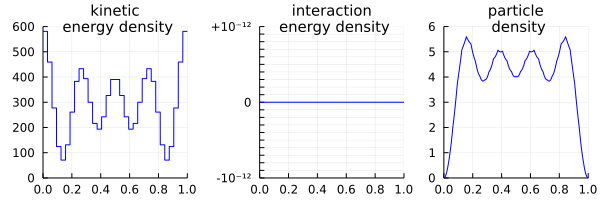

In [10]:
particle_density = expval(n̂, ΨTG)
kinetic_energy_density = expval(k̂, ΨTG)
interaction_energy_density = expval(û, ΨTG);
# plot densities
plotgrid = 0:1/3200:1;
p1 = plot(plotgrid, kinetic_energy_density.(plotgrid), label="", linecolor = :blue, xlims = (0,1), ylims = (0,600), title="kinetic\n energy density")
p2 = plot(plotgrid, interaction_energy_density.(plotgrid), label="", linecolor = :blue, xlims = (0,1), ylims=(-1e-12,1e-12), yticks=(collect(-1:0.1:1)*1e-12, ["-10⁻¹²"; repeat([""], 9); "0"; repeat([""], 9); "+10⁻¹²"]), title="interaction\n energy density")
p3 = plot(plotgrid, particle_density.(plotgrid), label="", linecolor = :blue, xlims = (0,1), ylims = (0,6), title="particle\n density")
plot(p1, p2, p3, layout = (1,3), titlefontsize = 10, tickfontsize = 8, size = (600, 200))

As we can see, the interaction energy of the Tonks-Girardeau state is zero. All the energy is in the kinetic energy, and it is given by the sum of the `N` lowest single particle energies, which we used to construct the state. As we have represented the single particle wavefunctions using a piecewise linear approximation, the resulting kinetic energy is discontinuous and consists of piecewise constant elements. In generic finite cMPS simulations below, there will be additional contributions to the kinetic energy, but the discontinuities resulting from differentiating piecewise linear functions will remain.

In [11]:
E = expval(Ĥ₀(g = 1e6), ΨTG)
Ekin = ∫(kinetic_energy_density, (a,b));
(E, Ekin)

(298.9066199350958, 298.9066199350958)

In [12]:
Ekin_exact = sum((π/(b-a)*n)^2 for n=1:N) # sum of single particle energies

296.08813203268073

This discrepancy is due to the coarseness of the grid.

In [13]:
K̂ = ∫(k̂, (a, b))
println(expval(K̂, tonksgirardeau_cmps(N, 0:1/32:1)) - Ekin_exact);
println(expval(K̂, tonksgirardeau_cmps(N, 0:1/64:1)) - Ekin_exact);
println(expval(K̂, tonksgirardeau_cmps(N, 0:1/128:1)) - Ekin_exact);

2.818487902415086
0.7023302737601398
0.17543728732260888


The error converges at a rate of $O(\Delta x^2)$ in the spacing $\Delta x$ of the grid. To visualize this, we compare the kinetic energy density and particle density of our cMPS representation of the Tonks-Girardeau state with piecewise linear matrix functions, with the exact particle and energy density of the Tonks-Girardeau state in the continuum, evaluated on a very fine grid.

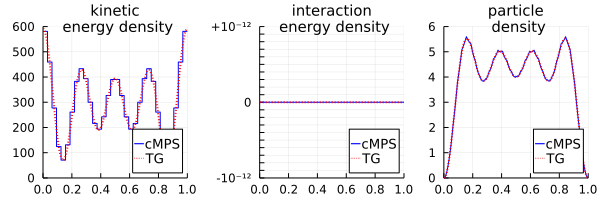

In [14]:
kinetic_energy_density_tg(x) = tonksgirardeau_energy_density(4, x, first(grid), last(grid));
interaction_energy_density_tg(x) = 0.;
particle_density_tg(x) = tonksgirardeau_particle_density(4, x, first(grid), last(grid));
p1 = plot(plotgrid, kinetic_energy_density.(plotgrid), label="cMPS", linecolor = :blue, xlims = (0,1), ylims = (0,600), title="kinetic\n energy density")
plot!(p1, plotgrid, kinetic_energy_density_tg.(plotgrid), label="TG", linecolor = :red, linewidth = 2, linestyle = :dot)
p2 = plot(plotgrid, interaction_energy_density.(plotgrid), label="cMPS", linecolor = :blue, xlims = (0,1), ylims=(-1e-12,1e-12), yticks=(collect(-1:0.1:1)*1e-12, ["-10⁻¹²"; repeat([""], 9); "0"; repeat([""], 9); "+10⁻¹²"]), title="interaction\n energy density")
plot!(p2, plotgrid, interaction_energy_density_tg.(plotgrid), label="TG", linecolor = :red, linewidth = 2, linestyle = :dot)
p3 = plot(plotgrid, particle_density.(plotgrid), label="cMPS", linecolor = :blue, xlims = (0,1), ylims = (0,6), title="particle\n density")
plot!(p3, plotgrid, particle_density_tg.(plotgrid), label="TG", linecolor = :red, linewidth = 2, linestyle = :dot)
plot(p1, p2, p3, layout = (1,3), titlefontsize = 10, tickfontsize = 8, legendfontsize = 9, size = (600, 200), legend = :bottomright)

## Variational optimization

To use variational optimization, we need to add a chemical potential, otherwise the lowest energy state is the vacuum with zero energy. We cannot directly target a given particle number in the current cMPS ansatz (unless with a Lagrange parameter, which is exactly the chemical potential).

In [15]:
# Hamiltonian with chemical potential
Ĥ₁(; g, μ) = Ĥ₀(g = g) - μ*N̂;

We build an initial cMPS with $D=8$ from which we will start the optimization. For $Q(x)$, we use a random constant matrix, whereas for $R(x)$ we use a random constant matrix multiplied with a standing wave ($\sin$ function) to satisfy the boundary conditions $R(a) = R(b) = 0$.

In [16]:
D = 8 # bond dimension
T = Float64 # scalar type
grid = 0:1/32:1 # still using the same grid as before
Q₀ = randn(T, (D,D))
R₀ = randn(T, (D,D))
Q = PiecewiseLinear(grid, [Q₀ for x in grid])
R = PiecewiseLinear(grid, [R₀*sin(π*(x-a)/(b-a)) for x in grid])
vL = setindex!(zeros(T, D), 1, 1)
vR = setindex!(zeros(T, D), 1, 1)
Ψ₀ = FiniteCMPS(Q, R, vL, vR);

We define a function to plot the different contributions to the energy density during the course of the optimization algorithm. As this depends on the value of $\mu$ and $g$, we make a function that returns the proper plot function to be passed to the optimization algorithm.

In [17]:
function plotresults₁(; μ, g, plotgrid = 0:1/3200:1, frequency = 10)
    function callback(numiter, E, normgrad, Ψ, ρL, ρR, e)
        if mod(numiter, frequency) == 0 # only plot results for certain iterations, as this would otherwise slow down
            IJulia.clear_output(true)
            kinetic_energy_density = expval(k̂, Ψ, ρL, ρR)
            interaction_energy_density = expval(g * û, Ψ, ρL, ρR);# plot densities
            particle_density = expval(n̂, Ψ, ρL, ρR)
            N = ∫(particle_density, (a, b))
            potential_energy_density = -μ*particle_density
            total_energy_density = e;
            p1 = plot(plotgrid, kinetic_energy_density.(plotgrid), xlims = (0,1), ylims = (-1500,1000), linecolor = :blue, linestyle = :dash, label="kinetic")
            plot!(p1, plotgrid, potential_energy_density.(plotgrid), linecolor = :blue, linestyle = :dot, label="potential")
            plot!(p1, plotgrid, interaction_energy_density.(plotgrid), linecolor = :blue,  linestyle = :dashdot, label="interaction")
            plot!(p1, plotgrid, total_energy_density.(plotgrid), linecolor = :blue, label="total")
            plot!(p1, title = "iteration $numiter\n energy densities (E = $(trunc(E; digits = 2)))")
            p2 = plot(plotgrid, particle_density.(plotgrid), label="", linecolor = :blue, xlims = (0,1), ylims = (0,6), title="gradient norm = $(trunc(normgrad; digits = 3)) \n particle density (N = $(trunc(N; digits = 4)))")
            display(plot(p1, p2, layout = (1,2), titlefontsize = 10, legendfontsize = 9, size = (600, 300), legend = :bottomright))
        end
    end
    return callback
end

plotresults₁ (generic function with 1 method)

We will be be looking for the optimal finite cMPS approximation to the ground state at $g=1e6$ with $N=4$ particles; choosing $\mu = (4.75\pi)^2$ as this value is in between the energy of the fourth and fifth energy eigenstates of a single particle in a box (standing waves).

In [18]:
μ = (4.75*π)^2
g = 1e6;

Optimizing directly at $g=1e6$ is however very challenging for gradient methods, and so we first optimize at a smaller value of $g$. We choose the LBFGS optimizer from OptimKit.jl and restrict the number of iterations to 1000. This is the first time the ground state routine runs and as it depends on several auxiliary methods, this call incurs some compilation overhead before starting the simulation.

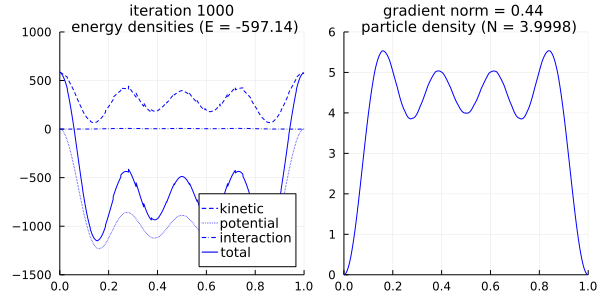

In [19]:
alg = LBFGS(80; maxiter = 1000)
Ψ, ρL, ρR, E, e, normgrad, numfg, history =
    groundstate(Ĥ₁(μ=μ, g=1e3), Ψ₀; optalg = alg, callback = plotresults₁(μ=μ, g=1e3));

Even for $g=10^3$, the result is not yet completely converged after 1000 iterations. For $g=10^6$, we easily need $O(10^6)$ iterations, though this can be mitigated by gradually increaging $g$ and by e.g. increasing the numbers of vectors kept in LBFGS. For convenience, however, we continue with an optimized cMPS that is loaded from disk.

Note that the `groundstate` routine not only returns the state, but also the matching reduced density matrices $\rho_L$ and $\rho_R$, as well as the total energy $E$ and energy density $e$. We can pass the density matrices along to `expval` so that they do not need to be recomputed when computing other expectation values. In the file loaded from disk, we have only stored the state to reduce storage needs. We can compute the environments with `environments!(Ψ)`, where the exclamation mark indicates that this function changes the argument (i.e., it normalizes the state). `environments!` takes keyword arguments `Kmax` and `tol` to control the required tolerance on the environments and the number of Taylor coefficients can be used. It returns the density matrices $\rho_L$ and $\rho_R$ together with two flags to indicate whether the requested tolerance was obtained.

In [20]:
optimisation = false; # change to `true` if you are very patient.
if optimisation
    Ψ₀ = Ψ
    alg = LBFGS(80; verbosity = 0, maxiter = 10^6, gradtol = 1e-3)
    Ψ, ρL, ρR, E, e, normgrad, numfg, history =
        groundstate(Ĥ₁(μ=μ, g=g), Ψ₀; optalg = alg, callback = plotresults₁(μ=μ, g=g));
else
    @load "FiniteCMPS_D=8_mu=223_g=1e6.jld" Ψ
    ρL, ρR, infoL, infoR = environments!(Ψ)
    E = expval(Ĥ₁(μ=μ, g=g), Ψ, ρL, ρR)
    e = expval(density(Ĥ₁(μ=μ, g=g)), Ψ, ρL, ρR)
end;
E

-594.4455915141803

For this state, we now also compute the local energy and particle densities. As we are still very close to the Tonks-Girardeau limit, we again plot the corresponding expectation values for the exact Tonks-Girardeau state with 4 particles.

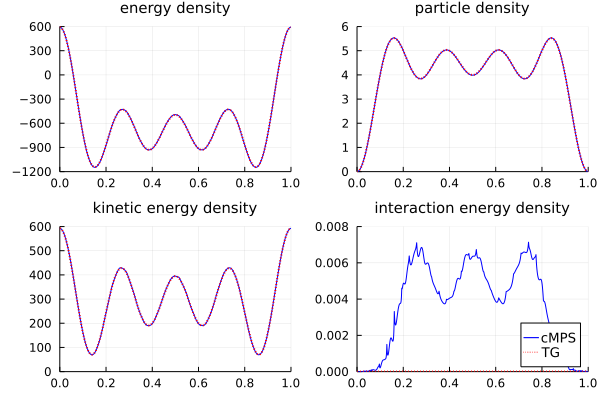

In [21]:
energy_density = e
particle_density = expval(n̂, Ψ, ρL, ρR)
kinetic_energy_density = expval(k̂, Ψ, ρL, ρR)
interaction_energy_density = expval(g*û, Ψ, ρL, ρR)
energy_density_tg(x) = kinetic_energy_density_tg(x) - μ * particle_density_tg(x)
plotgrid = 0:1/3200:1
p1 = plot(plotgrid, energy_density.(plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (-1200, 600), title = "energy density")
plot!(p1, plotgrid, energy_density_tg.(plotgrid), label = "", linecolor = :red, linewidth = 2, linestyle = :dot)
p2 = plot(plotgrid, particle_density.(plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0,6), title = "particle density")
plot!(p2, plotgrid, particle_density_tg.(plotgrid), label = "", linecolor = :red, linewidth = 2, linestyle = :dot)
p3 = plot(plotgrid, kinetic_energy_density.(plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0,600), title = "kinetic energy density")
plot!(p3, plotgrid, kinetic_energy_density_tg.(plotgrid), label = "", linecolor = :red, linewidth = 2, linestyle = :dot)
p4 = plot(plotgrid, interaction_energy_density.(plotgrid), label = "cMPS", linecolor = :blue, xlims = (0,1), ylims = (0, 8e-3), title = "interaction energy density")
plot!(p4, plotgrid, interaction_energy_density_tg.(plotgrid), label = "TG", linecolor = :red, linewidth = 2, linestyle = :dot)
fig1a = plot(p1, p2, p3, p4, layout = (2,2), titlefontsize = 10, tickfontsize = 8, legendfontsize = 9, legend = :bottomright, size = (600, 400))

We find almost perfect agreement with the predictions of the Tonks-Girardeau state. The only discrepancy is in the interaction energy, which is nonzero as we are not exactly at the TG limit ($g=\infty$). Note, however, that the interaction energy density here computed includes the factor $g=10^6$. This means that the expectation value $\langle \Psi| \hat{u}|\Psi\rangle$ itself is of the order of $10^{-9}$.

As indicated above, the Tonks-Girardeau state with 4 particles can be represented exactly as a cMPS with $D=2^4 = 16$, with a fully continuous $R$ matrix (and $Q=0$). The simple act of replacing this $R$ matrix with a piecewise linear approximation resulted in a error that is larger than the one obtained with the current, variationally optimised cMPS with $D=8$. By having non-trivial $Q$ and $R$ matrices, it seems that most of the non-smooth behaviour of the piecewise-linear approximation can be mitigated. This is clear from the plots above, but also from the total integrated value of e.g. the kinetic energy:

In [22]:
Ekin_tonksgirardeau = Ekin_exact;
Ekin_cMPS_D8 = integrate(kinetic_energy_density, (a, b));
@show (Ekin_tonksgirardeau, Ekin_cMPS_D8);
@show Ekin_cMPS_D8-Ekin_tonksgirardeau;

(Ekin_tonksgirardeau, Ekin_cMPS_D8) = (296.08813203268073, 296.2559766619721)
Ekin_cMPS_D8 - Ekin_tonksgirardeau = 0.16784462929138044


Comparing to the errors above, the error on the kinetic energy of the variational cMPS with $D=8$ is thus of the same magnitude as that of naively approximating the $D=16$ cMPS representation of the TG state with a piecewise linear approximation on a grid that is four times as fine.

The $D=8$ cMPS on the other hand does not have an exact particle number of $N=4$. Indeed, a generic cMPS represents a superposition of different particle numbers. However, the exact ground state of a finite system in the presence of a chemical potential (grand canonical ensemble at zero temperature) should nonetheless have a fixed particle number. We can investigate how well the finite cMPS with $D=8$ can reproduce this by measuring the fluctuations in the particle number:

In [23]:
(Q, (R,)) = Ψ
@show N = expval(N̂, Ψ, ρL, ρR); # particle number expectation value
@show ΔN² = 2*integrate(localdot(leftenv(N̂, (Ψ,ρL,ρR))[1], R*ρR*R')) + N - N^2; # particle number variance

N = expval(N̂, Ψ, ρL, ρR) = 3.999880646605036
ΔN² = (2 * integrate(localdot((leftenv(N̂, (Ψ, ρL, ρR)))[1], R * ρR * R')) + N) - N ^ 2 = 0.0003838953191177552


However, it is important that we allow for sufficiently high degree of the Taylor expansion in the determination of $\rho_L$ and $\rho_R$ to model the smooth behaviour between the grid points. In all of the previous, the required number of Taylor coefficients was determined automatically (based on some tolerance, and some high maximal cutoff), as we can inspect:

In [24]:
maximum(CMPSKit.degree, ρL.elements), maximum(CMPSKit.degree, ρR.elements)

(10, 17)

If instead we restrict this number of modes, we find an approximation to the true energy of our cMPS, which is not variational and does not converge monotonously, as we can observe by restricting the maximal number of modes to a small value:

In [25]:
Ekin_modedependence = [expval(integrate(k̂, (a,b)), Ψ; Kmax = K, tol = eps()) for K = 1:21];
@show Ekin_modedependence[1:10] .- Ekin_tonksgirardeau;
@show Ekin_modedependence[1:10] .- Ekin_modedependence[21];

┌ Warning: Non-positive left environment: Z = vR'*ρL(b)*vR = -0.16689201669708453
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/finitecmps/environments.jl:8
┌ Warning: Non-positive right environment: Z = vL'*ρR(a)*vL = -0.2450880668096186
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/finitecmps/environments.jl:39
┌ Warning: error in computing normalisation: Za = -0.2450880668096186, Zb = -0.16689201669708456
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/abstractcmps.jl:80
┌ Warning: error in computing normalisation: Za = 1.0091281664019145, Zb = 1.0491117385491848
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/abstractcmps.jl:80
┌ Warning: error in computing normalisation: Za = 0.9220598848883605, Zb = 0.9157353490420762
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/abstractcmps.jl:80
┌ Warning: error in computing normalisation: Za = 1.0035515328410443, Zb = 1.0075851670365983
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/abstractcmps.jl:80
┌ Warning: error in computing norm

Ekin_modedependence[1:10] .- Ekin_tonksgirardeau = [-496.4334031814936, 9.530682553998474, 6.26753882797334, 0.9436936668629414, 0.12321510471144848, 0.1763258872761071, 0.1664603614079283, 0.1681456411038198, 0.16783273721597425, 0.16784767169497172]
Ekin_modedependence[1:10] .- Ekin_modedependence[21] = [-496.6012478352425, 9.362837900249588, 6.099694174224453, 0.7758490131140547, -0.04462954903743821, 0.008481233527220411, -0.0013842923409583818, 0.00030098735493311324, -1.1916532912437106e-5, 3.0179460850376927e-6]


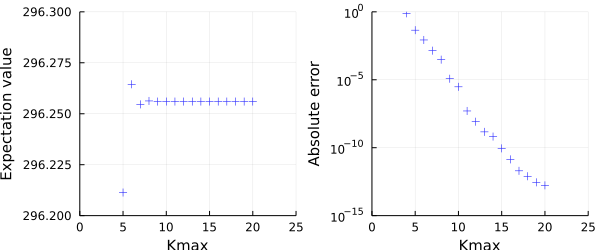

In [26]:
p1 = plot(2:20, Ekin_modedependence[2:20], seriestype = :scatter, markershape=:cross, markercolor=:blue, label="",
                xlabel = "Kmax", xlims = (0,25), ylims = (296.20,296.30), ylabel = "Expectation value", labelfontsize = 10)
p2 = plot(2:20, abs.(Ekin_modedependence[2:20] .- Ekin_modedependence[21]), seriestype = :scatter, markershape=:cross, markercolor=:blue, label="",
                xlabel = "Kmax", xlims = (0,25), ylims = (1e-15,1.), ylabel = "Absolute error", labelfontsize = 10, yscale = :log10)
appendix_fig1 = plot(p1, p2, layout = (1,2), labelfontsize = 10, tickfontsize = 8, size = (600, 250))


Hence, when the number of modes is too small, the error can be negative. This is problematic with a variational method, as an optimisation algorithm that minimises the energy will try exploit this in order to converge to a state with a very low yet unphysical energy. Hence, it is instrumental that we keep allow the number of Taylor coefficients to be sufficiently high so that the energy of our cMPS is computed accurately and is thus truly variational.

Finally, we also compute the entanglement spectrum of our cMPS for a bipartition of the system in left and right at various positions $x$. Hereto, we need to compute the eigenvalues of $\rho_L^{1/2} \rho_R \rho_L^{1/2}$, which are the same of those of $\rho_L \rho_R$. We cannot directly compute the eigenvalues of `ρL*ρR`, which is a `Piecewise` object, but first evaluate it at a given position and then compute the eigenvalues. These will be returned as complex values (because `ρL*ρR` is not symmetric or hermitian), though the imaginary part is zero. We just take the real part and sort them in decreasing order. Using Julia's dot notation for broadcasting, we can do this for all the positions in `entanglement_grid`. Then, we can also compute the corresponding entanglement entropy. (Note that we use absolute values in order to avoid problems with tiny entanglement values which might have become negative due to finite machine precision).

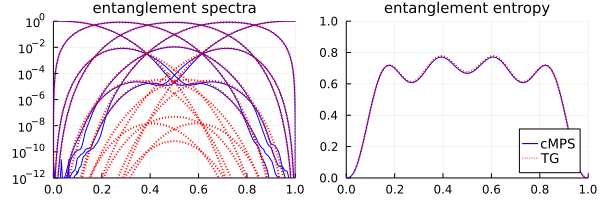

In [27]:
entanglement_grid = 0:1/3200:1
spectra = sort.(real.(eigvals.((ρL*ρR).(entanglement_grid))), rev=true)
spectra_reorganized = [collect(abs(s[i]) for s in spectra) for i = 1:D]
entropy(spectrum) = sum(-abs(p)*log(abs(p)) for p in spectrum)

ΨTG = tonksgirardeau_cmps(4, entanglement_grid)
ρLTG, ρRTG = environments!(ΨTG);
spectraTG = sort.(real.(eigvals.((ρLTG*ρRTG).(entanglement_grid))), rev=true)
spectraTG_reorganized = [collect(abs(s[i]+1e-30) for s in spectraTG) for i = 1:16]

p1 = plot(entanglement_grid, spectra_reorganized, linecolor = :blue, yscale = :log10, label="", xlim = (0,1), ylim = (1e-12,1), title = "entanglement spectra")
plot!(p1, entanglement_grid, spectraTG_reorganized, linewidth = 2, linecolor = :red, linestyle = :dot, yscale = :log10, label="")
p2 = plot(entanglement_grid, entropy.(spectra), linecolor = :blue, xlim = (0,1), ylim = (0, 1), label="cMPS", title = "entanglement entropy")
plot!(p2, entanglement_grid, entropy.(spectraTG), linewidth = 2, linecolor = :red, linestyle = :dot, label="TG")
fig1b = plot(p1, p2, layout = (1,2), titlefontsize = 10, tickfontsize = 8, legendfontsize = 9,  legend = :bottomright, size = (600, 200))

This plot compares the entanglement spectrum (entropy) of the variational cMPS with $D=8$ with that of the exact Tonks-Girardeau state, where we compute the entanglement characteristics of the latter by representing it as a $D=16$ cMPS on a very fine grid and using the same cMPS machinery. This plot shows that the variational cMPS, withing the piecewise linear basis, succeeds in capturing the largest entanglement values exactly, while truncating away the smallest one, exactly as in the DMRG/MPS philosophy.

## Inhomogeneous potential

We now study problems with an inhomogeneous potential $V(x)$. We hereto define a new Hamiltonian $\hat{H}_2$.

In [28]:
Ĥ₂(; g, μ, v) = Ĥ₁(;g = g, μ = μ) + ∫(v * ψ̂'*ψ̂, (a,b));

We consider a box with an external potential $V(x) \sim\sin(15\pi x)$, with $\mu = 1749$ and $g = 35$.

In [29]:
μ = 1749.
g = 35.
V(x) = sin(15*π*x)

V (generic function with 1 method)

We will find an optimal finite cMPS representation of the ground state with bond dimension $D=32$. To get a better initial state, we can first solve the homogeneous problem in the thermodynamic limit using infinite cMPS. We do not converge this to very high accuracy, as its only purpose is to build a slightly improved initial finite cMPS.

In [30]:
D = 32 # bond dimension
T = Float64 # scalar type
Q₀ = randn(T, (D,D))
R₀ = randn(T, (D,D))
Ψ∞ = InfiniteCMPS(Constant(Q₀), Constant(R₀))
Ĥ∞(; g, μ) = ∫(k̂ - μ * n̂ + g * û, (-Inf,+Inf));

In [31]:
alg = LBFGS(80; verbosity = 2, maxiter = 2000)
Ψ∞, ρL∞, ρR∞, E∞, e∞, normgrad, numfg, history = groundstate(Ĥ∞(g = g, μ = μ), Ψ∞; optalg = alg);

┌ Info: UniformCMPS ground state: initialization with e = -9308.395166519455
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:113
┌ Info: LBFGS: initializing with f = -9308.395166519455, ‖∇f‖ = 2.5581e+04
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:35
┌ Info: UniformCMPS ground state: iter    1: e = -22965.427298511138, ‖∇e‖ = 1.0339e+04
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter    1: f = -22965.427298511138, ‖∇f‖ = 1.0339e+04, α = 1.00e+00, m = 0, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter    2: e = -25829.294932152679, ‖∇e‖ = 5.2555e+03
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter    2: f = -25829.294932152679, ‖∇f‖ = 5.2555e+03, α = 1.00e+00, m = 1, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter    3: e = -

┌ Info: UniformCMPS ground state: iter   26: e = -32843.041679066613, ‖∇e‖ = 2.4779e+02
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter   26: f = -32843.041679066613, ‖∇f‖ = 2.4779e+02, α = 1.00e+00, m = 25, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter   27: e = -32848.019640959115, ‖∇e‖ = 2.6465e+02
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter   27: f = -32848.019640959115, ‖∇f‖ = 2.6465e+02, α = 1.00e+00, m = 26, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter   28: e = -32857.643736987404, ‖∇e‖ = 3.5841e+02
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter   28: f = -32857.643736987404, ‖∇f‖ = 3.5841e+02, α = 1.00e+00, m = 27, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter   51: e = -33424.905749256795, ‖∇e‖ = 2.2286e+02
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter   51: f = -33424.905749256795, ‖∇f‖ = 2.2286e+02, α = 1.00e+00, m = 50, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter   52: e = -33431.760080525237, ‖∇e‖ = 2.5155e+02
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter   52: f = -33431.760080525237, ‖∇f‖ = 2.5155e+02, α = 1.00e+00, m = 51, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter   53: e = -33439.335451990235, ‖∇e‖ = 2.7819e+02
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter   53: f = -33439.335451990235, ‖∇f‖ = 2.7819e+02, α = 1.00e+00, m = 52, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter   76: e = -33512.449250055019, ‖∇e‖ = 6.7264e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter   76: f = -33512.449250055019, ‖∇f‖ = 6.7264e+01, α = 1.00e+00, m = 75, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter   77: e = -33513.168345004167, ‖∇e‖ = 6.7904e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter   77: f = -33513.168345004167, ‖∇f‖ = 6.7904e+01, α = 1.00e+00, m = 76, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter   78: e = -33513.932332846853, ‖∇e‖ = 6.6506e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter   78: f = -33513.932332846853, ‖∇f‖ = 6.6506e+01, α = 1.00e+00, m = 77, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  101: e = -33540.125590629134, ‖∇e‖ = 1.0119e+02
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  101: f = -33540.125590629134, ‖∇f‖ = 1.0119e+02, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  102: e = -33541.605337359651, ‖∇e‖ = 2.1585e+02
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  102: f = -33541.605337359651, ‖∇f‖ = 2.1585e+02, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  103: e = -33543.619063009814, ‖∇e‖ = 1.3297e+02
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  103: f = -33543.619063009814, ‖∇f‖ = 1.3297e+02, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  126: e = -33571.322141893281, ‖∇e‖ = 4.5114e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  126: f = -33571.322141893281, ‖∇f‖ = 4.5114e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  127: e = -33571.609270868204, ‖∇e‖ = 3.9697e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  127: f = -33571.609270868204, ‖∇f‖ = 3.9697e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  128: e = -33571.964839702312, ‖∇e‖ = 5.2326e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  128: f = -33571.964839702312, ‖∇f‖ = 5.2326e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  151: e = -33580.557228152204, ‖∇e‖ = 3.5196e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  151: f = -33580.557228152204, ‖∇f‖ = 3.5196e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  152: e = -33580.698253059818, ‖∇e‖ = 3.1004e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  152: f = -33580.698253059818, ‖∇f‖ = 3.1004e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  153: e = -33580.814348486958, ‖∇e‖ = 4.0070e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  153: f = -33580.814348486958, ‖∇f‖ = 4.0070e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  176: e = -33607.488391732302, ‖∇e‖ = 4.6697e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  176: f = -33607.488391732302, ‖∇f‖ = 4.6697e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  177: e = -33607.708137050853, ‖∇e‖ = 5.4296e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  177: f = -33607.708137050853, ‖∇f‖ = 5.4296e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  178: e = -33607.857370932215, ‖∇e‖ = 3.8471e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  178: f = -33607.857370932215, ‖∇f‖ = 3.8471e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  201: e = -33621.178243061258, ‖∇e‖ = 1.4315e+02
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  201: f = -33621.178243061258, ‖∇f‖ = 1.4315e+02, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  202: e = -33623.466299667147, ‖∇e‖ = 2.1040e+02
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  202: f = -33623.466299667147, ‖∇f‖ = 2.1040e+02, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  203: e = -33626.897047278217, ‖∇e‖ = 1.7942e+02
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  203: f = -33626.897047278217, ‖∇f‖ = 1.7942e+02, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  226: e = -33664.777657990366, ‖∇e‖ = 7.8464e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  226: f = -33664.777657990366, ‖∇f‖ = 7.8464e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  227: e = -33665.642591742486, ‖∇e‖ = 1.0023e+02
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  227: f = -33665.642591742486, ‖∇f‖ = 1.0023e+02, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  228: e = -33666.650163909959, ‖∇e‖ = 9.2223e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  228: f = -33666.650163909959, ‖∇f‖ = 9.2223e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  251: e = -33689.411153381385, ‖∇e‖ = 1.2321e+02
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  251: f = -33689.411153381385, ‖∇f‖ = 1.2321e+02, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  252: e = -33690.351500841374, ‖∇e‖ = 9.1715e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  252: f = -33690.351500841374, ‖∇f‖ = 9.1715e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  253: e = -33691.572314885634, ‖∇e‖ = 9.1251e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  253: f = -33691.572314885634, ‖∇f‖ = 9.1251e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  276: e = -33710.433796681493, ‖∇e‖ = 4.0420e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  276: f = -33710.433796681493, ‖∇f‖ = 4.0420e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  277: e = -33710.687924741047, ‖∇e‖ = 6.1837e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  277: f = -33710.687924741047, ‖∇f‖ = 6.1837e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  278: e = -33710.906631562248, ‖∇e‖ = 3.8921e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  278: f = -33710.906631562248, ‖∇f‖ = 3.8921e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  301: e = -33716.696761878819, ‖∇e‖ = 3.0095e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  301: f = -33716.696761878819, ‖∇f‖ = 3.0095e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  302: e = -33716.879689653477, ‖∇e‖ = 2.7131e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  302: f = -33716.879689653477, ‖∇f‖ = 2.7131e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  303: e = -33716.944737043450, ‖∇e‖ = 7.4409e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  303: f = -33716.944737043450, ‖∇f‖ = 7.4409e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  326: e = -33720.080191900881, ‖∇e‖ = 7.4724e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  326: f = -33720.080191900881, ‖∇f‖ = 7.4724e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  327: e = -33720.335097657917, ‖∇e‖ = 3.8559e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  327: f = -33720.335097657917, ‖∇f‖ = 3.8559e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  328: e = -33720.573832069291, ‖∇e‖ = 3.5620e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  328: f = -33720.573832069291, ‖∇f‖ = 3.5620e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  351: e = -33723.607062888070, ‖∇e‖ = 3.4653e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  351: f = -33723.607062888070, ‖∇f‖ = 3.4653e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  352: e = -33723.812224222900, ‖∇e‖ = 5.5584e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  352: f = -33723.812224222900, ‖∇f‖ = 5.5584e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  353: e = -33724.065238660871, ‖∇e‖ = 5.2033e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  353: f = -33724.065238660871, ‖∇f‖ = 5.2033e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  376: e = -33730.828594309627, ‖∇e‖ = 3.5169e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  376: f = -33730.828594309627, ‖∇f‖ = 3.5169e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  377: e = -33731.122516233496, ‖∇e‖ = 7.1479e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  377: f = -33731.122516233496, ‖∇f‖ = 7.1479e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  378: e = -33731.320020808998, ‖∇e‖ = 6.5277e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  378: f = -33731.320020808998, ‖∇f‖ = 6.5277e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  401: e = -33743.950625549667, ‖∇e‖ = 5.4987e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  401: f = -33743.950625549667, ‖∇f‖ = 5.4987e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  402: e = -33744.313909692086, ‖∇e‖ = 6.1296e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  402: f = -33744.313909692086, ‖∇f‖ = 6.1296e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  403: e = -33744.619767259443, ‖∇e‖ = 4.5843e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  403: f = -33744.619767259443, ‖∇f‖ = 4.5843e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  426: e = -33753.096974334796, ‖∇e‖ = 4.0023e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  426: f = -33753.096974334796, ‖∇f‖ = 4.0023e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  427: e = -33753.284327968257, ‖∇e‖ = 3.2747e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  427: f = -33753.284327968257, ‖∇f‖ = 3.2747e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  428: e = -33753.469381467941, ‖∇e‖ = 4.0230e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  428: f = -33753.469381467941, ‖∇f‖ = 4.0230e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  451: e = -33756.248477508329, ‖∇e‖ = 2.3297e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  451: f = -33756.248477508329, ‖∇f‖ = 2.3297e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  452: e = -33756.341841542635, ‖∇e‖ = 3.0639e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  452: f = -33756.341841542635, ‖∇f‖ = 3.0639e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  453: e = -33756.389063842958, ‖∇e‖ = 3.5751e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  453: f = -33756.389063842958, ‖∇f‖ = 3.5751e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  476: e = -33757.756419844423, ‖∇e‖ = 1.5209e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  476: f = -33757.756419844423, ‖∇f‖ = 1.5209e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  477: e = -33757.801861933040, ‖∇e‖ = 1.9637e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  477: f = -33757.801861933040, ‖∇f‖ = 1.9637e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  478: e = -33757.856318125072, ‖∇e‖ = 1.6883e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  478: f = -33757.856318125072, ‖∇f‖ = 1.6883e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  501: e = -33759.529227747989, ‖∇e‖ = 2.7480e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  501: f = -33759.529227747989, ‖∇f‖ = 2.7480e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  502: e = -33759.594237207268, ‖∇e‖ = 1.7014e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  502: f = -33759.594237207268, ‖∇f‖ = 1.7014e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  503: e = -33759.664245337975, ‖∇e‖ = 2.1262e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  503: f = -33759.664245337975, ‖∇f‖ = 2.1262e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  526: e = -33760.826661976876, ‖∇e‖ = 2.0328e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  526: f = -33760.826661976876, ‖∇f‖ = 2.0328e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  527: e = -33760.855311347863, ‖∇e‖ = 9.0256e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  527: f = -33760.855311347863, ‖∇f‖ = 9.0256e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  528: e = -33760.882959849318, ‖∇e‖ = 9.2234e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  528: f = -33760.882959849318, ‖∇f‖ = 9.2234e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  551: e = -33762.205232792723, ‖∇e‖ = 1.4344e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  551: f = -33762.205232792723, ‖∇f‖ = 1.4344e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  552: e = -33762.280669018553, ‖∇e‖ = 2.2405e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  552: f = -33762.280669018553, ‖∇f‖ = 2.2405e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  553: e = -33762.397324893631, ‖∇e‖ = 2.8645e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  553: f = -33762.397324893631, ‖∇f‖ = 2.8645e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  576: e = -33765.433129410936, ‖∇e‖ = 3.5794e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  576: f = -33765.433129410936, ‖∇f‖ = 3.5794e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  577: e = -33765.584093517093, ‖∇e‖ = 5.0779e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  577: f = -33765.584093517093, ‖∇f‖ = 5.0779e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  578: e = -33765.753030602049, ‖∇e‖ = 2.9202e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  578: f = -33765.753030602049, ‖∇f‖ = 2.9202e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  601: e = -33768.485818227382, ‖∇e‖ = 1.9625e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  601: f = -33768.485818227382, ‖∇f‖ = 1.9625e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  602: e = -33768.584913322047, ‖∇e‖ = 2.7778e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  602: f = -33768.584913322047, ‖∇f‖ = 2.7778e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  603: e = -33768.700665810386, ‖∇e‖ = 3.2331e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  603: f = -33768.700665810386, ‖∇f‖ = 3.2331e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  626: e = -33771.453843642048, ‖∇e‖ = 6.4830e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  626: f = -33771.453843642048, ‖∇f‖ = 6.4830e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  627: e = -33771.597761371071, ‖∇e‖ = 2.5349e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  627: f = -33771.597761371071, ‖∇f‖ = 2.5349e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  628: e = -33771.688762075733, ‖∇e‖ = 2.4690e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  628: f = -33771.688762075733, ‖∇f‖ = 2.4690e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  651: e = -33774.790633370845, ‖∇e‖ = 2.2664e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  651: f = -33774.790633370845, ‖∇f‖ = 2.2664e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  652: e = -33774.881154811432, ‖∇e‖ = 3.3725e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  652: f = -33774.881154811432, ‖∇f‖ = 3.3725e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  653: e = -33774.956795508544, ‖∇e‖ = 2.1865e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  653: f = -33774.956795508544, ‖∇f‖ = 2.1865e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  676: e = -33777.248192718995, ‖∇e‖ = 1.2821e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  676: f = -33777.248192718995, ‖∇f‖ = 1.2821e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  677: e = -33777.342833241208, ‖∇e‖ = 2.2441e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  677: f = -33777.342833241208, ‖∇f‖ = 2.2441e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  678: e = -33777.424928108223, ‖∇e‖ = 3.0662e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  678: f = -33777.424928108223, ‖∇f‖ = 3.0662e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  701: e = -33778.914519800019, ‖∇e‖ = 2.3492e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  701: f = -33778.914519800019, ‖∇f‖ = 2.3492e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  702: e = -33778.973676962560, ‖∇e‖ = 3.5985e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  702: f = -33778.973676962560, ‖∇f‖ = 3.5985e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  703: e = -33779.027704502980, ‖∇e‖ = 2.4918e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  703: f = -33779.027704502980, ‖∇f‖ = 2.4918e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  726: e = -33780.852664975660, ‖∇e‖ = 1.6765e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  726: f = -33780.852664975660, ‖∇f‖ = 1.6765e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  727: e = -33780.918533921911, ‖∇e‖ = 2.0785e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  727: f = -33780.918533921911, ‖∇f‖ = 2.0785e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  728: e = -33781.018017098249, ‖∇e‖ = 3.0002e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  728: f = -33781.018017098249, ‖∇f‖ = 3.0002e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  751: e = -33782.341925839130, ‖∇e‖ = 3.6565e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  751: f = -33782.341925839130, ‖∇f‖ = 3.6565e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  752: e = -33782.409482041425, ‖∇e‖ = 1.9575e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  752: f = -33782.409482041425, ‖∇f‖ = 1.9575e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  753: e = -33782.457979206200, ‖∇e‖ = 1.7091e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  753: f = -33782.457979206200, ‖∇f‖ = 1.7091e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  776: e = -33783.800369167446, ‖∇e‖ = 1.2603e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  776: f = -33783.800369167446, ‖∇f‖ = 1.2603e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  777: e = -33783.836135191297, ‖∇e‖ = 1.0045e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  777: f = -33783.836135191297, ‖∇f‖ = 1.0045e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  778: e = -33783.904447098103, ‖∇e‖ = 1.7246e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  778: f = -33783.904447098103, ‖∇f‖ = 1.7246e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  801: e = -33784.918218401799, ‖∇e‖ = 2.2138e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  801: f = -33784.918218401799, ‖∇f‖ = 2.2138e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  802: e = -33784.949453807727, ‖∇e‖ = 1.8896e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  802: f = -33784.949453807727, ‖∇f‖ = 1.8896e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  803: e = -33784.981154011562, ‖∇e‖ = 1.0342e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  803: f = -33784.981154011562, ‖∇f‖ = 1.0342e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  826: e = -33786.045644861595, ‖∇e‖ = 2.1954e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  826: f = -33786.045644861595, ‖∇f‖ = 2.1954e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  827: e = -33786.077844297281, ‖∇e‖ = 1.9414e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  827: f = -33786.077844297281, ‖∇f‖ = 1.9414e+01, α = 5.27e-01, m = 80, nfg = 2
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  828: e = -33786.108868252108, ‖∇e‖ = 1.0343e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  828: f = -33786.108868252108, ‖∇f‖ = 1.0343e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  851: e = -33787.055352989701, ‖∇e‖ = 2.0887e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  851: f = -33787.055352989701, ‖∇f‖ = 2.0887e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  852: e = -33787.088263251862, ‖∇e‖ = 1.0999e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  852: f = -33787.088263251862, ‖∇f‖ = 1.0999e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  853: e = -33787.111545974294, ‖∇e‖ = 8.2740e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  853: f = -33787.111545974294, ‖∇f‖ = 8.2740e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  876: e = -33787.965403455259, ‖∇e‖ = 1.4661e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  876: f = -33787.965403455259, ‖∇f‖ = 1.4661e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  877: e = -33788.013336266107, ‖∇e‖ = 2.2814e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  877: f = -33788.013336266107, ‖∇f‖ = 2.2814e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  878: e = -33788.047426699974, ‖∇e‖ = 1.3029e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  878: f = -33788.047426699974, ‖∇f‖ = 1.3029e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  901: e = -33788.793994291082, ‖∇e‖ = 9.9284e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  901: f = -33788.793994291082, ‖∇f‖ = 9.9284e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  902: e = -33788.831107765844, ‖∇e‖ = 1.3344e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  902: f = -33788.831107765844, ‖∇f‖ = 1.3344e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  903: e = -33788.878134236475, ‖∇e‖ = 2.2655e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  903: f = -33788.878134236475, ‖∇f‖ = 2.2655e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  926: e = -33789.691154490705, ‖∇e‖ = 1.0770e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  926: f = -33789.691154490705, ‖∇f‖ = 1.0770e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  927: e = -33789.719503866349, ‖∇e‖ = 1.4451e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  927: f = -33789.719503866349, ‖∇f‖ = 1.4451e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  928: e = -33789.742055864263, ‖∇e‖ = 1.2680e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  928: f = -33789.742055864263, ‖∇f‖ = 1.2680e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  951: e = -33790.261509829623, ‖∇e‖ = 1.1270e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  951: f = -33790.261509829623, ‖∇f‖ = 1.1270e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  952: e = -33790.279183386199, ‖∇e‖ = 1.8771e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  952: f = -33790.279183386199, ‖∇f‖ = 1.8771e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  953: e = -33790.295922272089, ‖∇e‖ = 8.5709e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  953: f = -33790.295922272089, ‖∇f‖ = 8.5709e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter  976: e = -33790.771112463088, ‖∇e‖ = 9.0200e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  976: f = -33790.771112463088, ‖∇f‖ = 9.0200e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  977: e = -33790.798666603667, ‖∇e‖ = 9.7078e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  977: f = -33790.798666603667, ‖∇f‖ = 9.7078e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter  978: e = -33790.820244316223, ‖∇e‖ = 1.4614e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter  978: f = -33790.820244316223, ‖∇f‖ = 1.4614e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1001: e = -33791.314221623397, ‖∇e‖ = 1.2082e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1001: f = -33791.314221623397, ‖∇f‖ = 1.2082e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1002: e = -33791.328372661279, ‖∇e‖ = 2.5993e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1002: f = -33791.328372661279, ‖∇f‖ = 2.5993e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1003: e = -33791.353975191218, ‖∇e‖ = 8.9163e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1003: f = -33791.353975191218, ‖∇f‖ = 8.9163e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1026: e = -33791.793219158011, ‖∇e‖ = 1.1403e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1026: f = -33791.793219158011, ‖∇f‖ = 1.1403e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1027: e = -33791.811868121935, ‖∇e‖ = 7.1620e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1027: f = -33791.811868121935, ‖∇f‖ = 7.1620e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1028: e = -33791.832394495352, ‖∇e‖ = 6.6256e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1028: f = -33791.832394495352, ‖∇f‖ = 6.6256e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1051: e = -33792.232082992268, ‖∇e‖ = 6.9896e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1051: f = -33792.232082992268, ‖∇f‖ = 6.9896e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1052: e = -33792.256831355466, ‖∇e‖ = 1.2414e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1052: f = -33792.256831355466, ‖∇f‖ = 1.2414e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1053: e = -33792.270874025155, ‖∇e‖ = 1.5495e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1053: f = -33792.270874025155, ‖∇f‖ = 1.5495e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1076: e = -33792.620920173213, ‖∇e‖ = 4.8236e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1076: f = -33792.620920173213, ‖∇f‖ = 4.8236e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1077: e = -33792.638823233821, ‖∇e‖ = 8.9673e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1077: f = -33792.638823233821, ‖∇f‖ = 8.9673e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1078: e = -33792.660409343072, ‖∇e‖ = 1.1047e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1078: f = -33792.660409343072, ‖∇f‖ = 1.1047e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1101: e = -33793.082360567445, ‖∇e‖ = 2.2591e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1101: f = -33793.082360567445, ‖∇f‖ = 2.2591e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1102: e = -33793.107341770818, ‖∇e‖ = 8.6181e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1102: f = -33793.107341770818, ‖∇f‖ = 8.6181e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1103: e = -33793.122840479162, ‖∇e‖ = 8.9779e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1103: f = -33793.122840479162, ‖∇f‖ = 8.9779e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1126: e = -33793.716390573260, ‖∇e‖ = 7.2627e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1126: f = -33793.716390573260, ‖∇f‖ = 7.2627e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1127: e = -33793.753518601603, ‖∇e‖ = 1.1326e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1127: f = -33793.753518601603, ‖∇f‖ = 1.1326e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1128: e = -33793.786113691007, ‖∇e‖ = 1.8339e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1128: f = -33793.786113691007, ‖∇f‖ = 1.8339e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1151: e = -33794.366798708310, ‖∇e‖ = 7.2589e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1151: f = -33794.366798708310, ‖∇f‖ = 7.2589e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1152: e = -33794.381619433734, ‖∇e‖ = 6.0732e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1152: f = -33794.381619433734, ‖∇f‖ = 6.0732e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1153: e = -33794.414646570760, ‖∇e‖ = 1.1598e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1153: f = -33794.414646570760, ‖∇f‖ = 1.1598e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1176: e = -33794.847750654822, ‖∇e‖ = 9.0468e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1176: f = -33794.847750654822, ‖∇f‖ = 9.0468e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1177: e = -33794.858441961362, ‖∇e‖ = 5.1892e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1177: f = -33794.858441961362, ‖∇f‖ = 5.1892e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1178: e = -33794.876653905885, ‖∇e‖ = 8.6485e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1178: f = -33794.876653905885, ‖∇f‖ = 8.6485e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1201: e = -33795.335828520641, ‖∇e‖ = 9.4660e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1201: f = -33795.335828520641, ‖∇f‖ = 9.4660e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1202: e = -33795.346959509123, ‖∇e‖ = 5.6152e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1202: f = -33795.346959509123, ‖∇f‖ = 5.6152e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1203: e = -33795.363873336071, ‖∇e‖ = 7.4926e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1203: f = -33795.363873336071, ‖∇f‖ = 7.4926e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1226: e = -33795.803289828407, ‖∇e‖ = 5.0577e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1226: f = -33795.803289828407, ‖∇f‖ = 5.0577e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1227: e = -33795.821887688908, ‖∇e‖ = 6.2047e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1227: f = -33795.821887688908, ‖∇f‖ = 6.2047e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1228: e = -33795.838600739575, ‖∇e‖ = 8.2597e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1228: f = -33795.838600739575, ‖∇f‖ = 8.2597e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1251: e = -33796.166107105193, ‖∇e‖ = 2.4367e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1251: f = -33796.166107105193, ‖∇f‖ = 2.4367e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1252: e = -33796.185017595802, ‖∇e‖ = 8.4504e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1252: f = -33796.185017595802, ‖∇f‖ = 8.4504e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1253: e = -33796.195153929097, ‖∇e‖ = 5.5937e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1253: f = -33796.195153929097, ‖∇f‖ = 5.5937e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1276: e = -33796.608512481842, ‖∇e‖ = 2.0617e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1276: f = -33796.608512481842, ‖∇f‖ = 2.0617e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1277: e = -33796.626833845687, ‖∇e‖ = 7.4980e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1277: f = -33796.626833845687, ‖∇f‖ = 7.4980e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1278: e = -33796.640967896361, ‖∇e‖ = 6.4426e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1278: f = -33796.640967896361, ‖∇f‖ = 6.4426e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1301: e = -33797.043405331468, ‖∇e‖ = 9.2771e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1301: f = -33797.043405331468, ‖∇f‖ = 9.2771e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1302: e = -33797.068949135144, ‖∇e‖ = 1.5936e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1302: f = -33797.068949135144, ‖∇f‖ = 1.5936e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1303: e = -33797.088603157565, ‖∇e‖ = 1.4161e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1303: f = -33797.088603157565, ‖∇f‖ = 1.4161e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1326: e = -33797.477126956677, ‖∇e‖ = 7.4328e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1326: f = -33797.477126956677, ‖∇f‖ = 7.4328e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1327: e = -33797.496388134139, ‖∇e‖ = 1.0109e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1327: f = -33797.496388134139, ‖∇f‖ = 1.0109e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1328: e = -33797.506288535311, ‖∇e‖ = 2.5518e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1328: f = -33797.506288535311, ‖∇f‖ = 2.5518e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1351: e = -33797.870209426532, ‖∇e‖ = 6.8017e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1351: f = -33797.870209426532, ‖∇f‖ = 6.8017e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1352: e = -33797.897024161284, ‖∇e‖ = 1.0183e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1352: f = -33797.897024161284, ‖∇f‖ = 1.0183e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1353: e = -33797.911426205246, ‖∇e‖ = 2.6554e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1353: f = -33797.911426205246, ‖∇f‖ = 2.6554e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1376: e = -33798.392791161226, ‖∇e‖ = 1.3689e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1376: f = -33798.392791161226, ‖∇f‖ = 1.3689e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1377: e = -33798.405561953725, ‖∇e‖ = 6.4718e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1377: f = -33798.405561953725, ‖∇f‖ = 6.4718e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1378: e = -33798.418624816521, ‖∇e‖ = 6.7211e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1378: f = -33798.418624816521, ‖∇f‖ = 6.7211e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1401: e = -33798.802166471374, ‖∇e‖ = 4.7276e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1401: f = -33798.802166471374, ‖∇f‖ = 4.7276e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1402: e = -33798.818797350912, ‖∇e‖ = 7.4720e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1402: f = -33798.818797350912, ‖∇f‖ = 7.4720e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1403: e = -33798.840967211399, ‖∇e‖ = 1.2939e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1403: f = -33798.840967211399, ‖∇f‖ = 1.2939e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1426: e = -33799.214444909187, ‖∇e‖ = 2.0043e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1426: f = -33799.214444909187, ‖∇f‖ = 2.0043e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1427: e = -33799.234824033338, ‖∇e‖ = 9.9444e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1427: f = -33799.234824033338, ‖∇f‖ = 9.9444e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1428: e = -33799.249985632770, ‖∇e‖ = 7.0567e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1428: f = -33799.249985632770, ‖∇f‖ = 7.0567e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1451: e = -33799.738230096977, ‖∇e‖ = 1.5703e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1451: f = -33799.738230096977, ‖∇f‖ = 1.5703e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1452: e = -33799.762075583159, ‖∇e‖ = 1.3164e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1452: f = -33799.762075583159, ‖∇f‖ = 1.3164e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1453: e = -33799.780909950023, ‖∇e‖ = 7.6528e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1453: f = -33799.780909950023, ‖∇f‖ = 7.6528e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

┌ Info: UniformCMPS ground state: iter 1476: e = -33800.313046756273, ‖∇e‖ = 1.2173e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1476: f = -33800.313046756273, ‖∇f‖ = 1.2173e+01, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1477: e = -33800.326627160073, ‖∇e‖ = 1.5924e+01
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1477: f = -33800.326627160073, ‖∇f‖ = 1.5924e+01, α = 4.65e-01, m = 80, nfg = 2
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: UniformCMPS ground state: iter 1478: e = -33800.345733152346, ‖∇e‖ = 7.2211e+00
└ @ CMPSKit /Users/jutho/.julia/dev/CMPSKit/src/infinitecmps/groundstate.jl:94
┌ Info: LBFGS: iter 1478: f = -33800.345733152346, ‖∇f‖ = 7.2211e+00, α = 1.00e+00, m = 80, nfg = 1
└ @ OptimKit /Users/jutho/.julia/dev/OptimKit/src/lbfgs.jl:76
┌ Info: Unifo

We now use the $Q$ and $R$ matrix of this infinite cMPS to initialize the finite cMPS. Note that all matrices are wrapped in the type `Constant`, which indicates that they are constant functions, and not, say, periodic functions represented as a `FourierSeries`. Also note that the resulting cMPS is in the left gauge. We transform it to a symmetric gauge where $\rho_L = \rho_R$ and are a diagonal matrix $\Lambda$.

In [32]:
Q∞, (R∞,) = Ψ∞
Q₀ = Q∞[]
R₀ = R∞[]
@show norm(Q₀ + Q₀' + R₀'*R₀) # test ρ_L = I
Σ, U = eigen(Hermitian(ρR∞[]); sortby=x->(-abs(x)))
Λ = Diagonal(sqrt.(Σ))
Q₀ = sqrt(Λ)\U'*Q₀*U*sqrt(Λ)
R₀ = sqrt(Λ)\U'*R₀*U*sqrt(Λ)
@show norm(Q₀*Λ + Λ*Q₀' + R₀*Λ*R₀') # test ρ_R = Λ
@show norm(Λ*Q₀ + Q₀'*Λ + R₀'*Λ*R₀); # test ρ_L = Λ

norm(Q₀ + Q₀' + R₀' * R₀) = 4.411695165084487e-12
norm(Q₀ * Λ + Λ * Q₀' + R₀ * Λ * R₀') = 2.864981143387326e-10
norm(Λ * Q₀ + Q₀' * Λ + R₀' * Λ * R₀) = 1.056213458260832e-13


We also measure the particle density in this state:

In [33]:
n∞ = expval(n̂, Ψ∞);
@show n∞[];

n∞[] = 34.99117387895839


We now build a finite cMPS on a grid with $\Delta x = 10^{-2}$ by using $Q(x)=Q_0$ and $R(x)=R_0 f(x)$ with $f(a)=f(b) = 0$ and $f(x) \approx 1$ in the middle. Given that there will be $O(30)$ particles in the box of length $b-a = 1$, we should probably reach the bulk behaviour in a distance of about $\delta \approx 1/30$.

In [34]:
D = 32 # bond dimension
T = Float64 # scalar type
grid = 0:1/100:1
Q = PiecewiseLinear(grid, [Q₀ for x in grid])
δ = 1/30
R = PiecewiseLinear(grid, [R₀*ifelse(x<δ, x/δ, ifelse(1-x < δ, (1-x)/δ, 1.)) for x in grid])
vL = setindex!(zeros(T, D), 1, 1)
vR = setindex!(zeros(T, D), 1, 1)
Ψ₀ = FiniteCMPS(Q, R, vL, vR);

In order to use the inhomogeneous potential $V(x)$ in our groundstate algorithm, we also have to represent it as a `Piecewise` of `TaylorSeries` elements. 

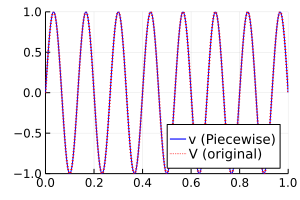

In [35]:
v = CMPSKit.Piecewise(grid, [fit(V, TaylorSeries, (grid[i],grid[i+1])) for i in 1:length(grid)-1])
# let's confirm this works
p = plot(plotgrid, v.(plotgrid), label = "v (Piecewise)", linecolor = :blue, xlim = (0,1), ylim = (-1,1));
plot!(p, plotgrid, V.(plotgrid), label = "V (original)", linecolor = :red, linewidth = 2, linestyle = :dot)
plot(p, tickfontsize = 8, legendfontsize = 9,  legend = :bottomright, size = (300, 200))

We also adapt the callback function to plot the results during the optimisation.

In [36]:
function plotresults₂(; μ, v, g, plotgrid = 0:1/500:1, frequency = 1)
    function callback(numiter, E, normgrad, Ψ, ρL, ρR, e)
        if mod(numiter, frequency) == 0
            IJulia.clear_output(true)
            kinetic_energy_density = expval(k̂, Ψ, ρL, ρR)
            interaction_energy_density = expval(g * û, Ψ, ρL, ρR);# plot densities
            particle_density = expval(n̂, Ψ, ρL, ρR)
            N = ∫(particle_density, (a, b))
            potential_energy_density = expval((v - μ*one(v)) * n̂, Ψ, ρL, ρR)
            total_energy_density = e;
            p1 = plot(plotgrid, kinetic_energy_density.(plotgrid), xlims = (0,1), ylims = (-20e4, 10e4), linecolor = :blue, linestyle = :dash, yticks = ([-20e4, -15e4,-10e4,-5e4,0,5e4,10e4],["-20×10⁴","-15×10⁴","-10×10⁴","-5×10⁴","0","+5×10⁴","+10×10⁴"]), label="kinetic")
            plot!(p1, plotgrid, potential_energy_density.(plotgrid), linecolor = :blue, linestyle = :dot, label="potential")
            plot!(p1, plotgrid, interaction_energy_density.(plotgrid), linecolor = :blue, linestyle = :dashdot, label="interaction")
            plot!(p1, plotgrid, total_energy_density.(plotgrid), linecolor = :blue, label="total")
            plot!(p1, title = "iteration $numiter\n energy densities (E = $(trunc(E; digits = 2)))")
            p2 = plot(plotgrid, particle_density.(plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0,60), title="gradient norm = $(trunc(normgrad; digits = 3)) \n particle density (N = $(trunc(N; digits = 4)))")
            display(plot(p1, p2, layout = (1,2), titlefontsize = 10, tickfontsize = 8, legendfontsize = 9,  legend = :bottomright, size = (600, 300)))
        end
    end
    return callback
end

plotresults₂ (generic function with 1 method)

We now compute the finite cMPS ground state approximation for three different values of $V(x)$ with increasing modulation strength, namely $V_1(x) = \frac{\mu}{4} \sin(15 \pi x)$, $V_2(x) = \frac{\mu}{2} \sin(15 \pi x)$ and $V_3(x) = \mu \sin(15 \pi x)$. For $V_1(x)$, we use $\Psi_0$ as an initial guess. For the next values of $V(x)$, we can use the previous result. In a few 100 iterations, the result are already qualitatively good.

In [37]:
v₁ = μ/4*v
v₂ = μ/2*v
v₃ = μ*v;

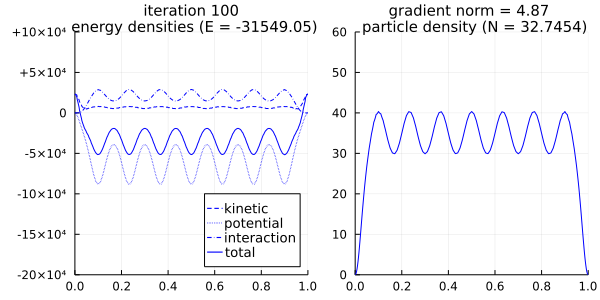

In [38]:
alg = LBFGS(50; maxiter = 100)
Ψ₁, ρL₁, ρR₁, E₁, e₁ =
    groundstate(Ĥ₂(μ = μ, v = v₁, g = g), Ψ₀; optalg = alg, callback = plotresults₂(μ = μ, g = g, v = v₁));

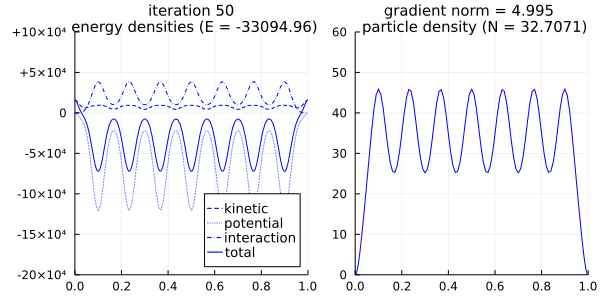

In [39]:
alg = LBFGS(50; maxiter = 50)
Ψ₂, ρL₂, ρR₂, E₂, e₂ =
    groundstate(Ĥ₂(μ = μ, v = v₂, g = g), Ψ₁; optalg = alg, callback = plotresults₂(μ = μ, g = g, v = v₂));

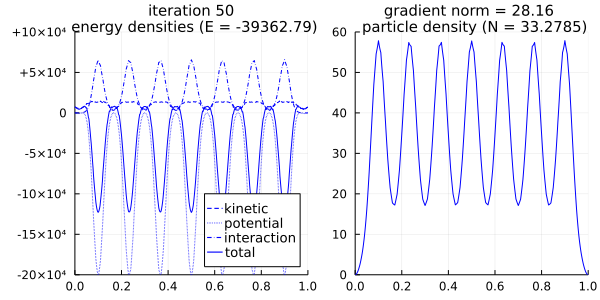

In [40]:
alg = LBFGS(50; maxiter = 50)
Ψ₃, ρL₃, ρR₃, E₃, e₃ =
    groundstate(Ĥ₂(μ = μ, v = v₃, g = g), Ψ₂; optalg = alg, callback = plotresults₂(μ = μ, g = g, v = v₃));

To proceed, we can load better converged results from disk, though this is not strictly necessary. Note that they are a bit smoother and have a slightly lower energy, but more significantly that they have a better converged total particle number and thus less particle number fluctuations.

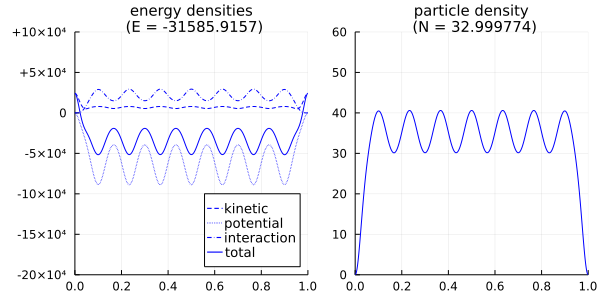

In [41]:
@load "FiniteCMPS_D=32_mu=1749_g=35_v=437sin.jld" Ψ
ρL, ρR, = environments!(Ψ)
total_energy_density = expval(density(Ĥ₂(μ = μ, v = v₁, g = g)), Ψ, ρL, ρR)
E = ∫(total_energy_density, (a, b))
kinetic_energy_density = expval(k̂, Ψ, ρL, ρR)
interaction_energy_density = expval(g * û, Ψ, ρL, ρR);# plot densities
particle_density = expval(n̂, Ψ, ρL, ρR)
N = ∫(particle_density, (a, b))
potential_energy_density = expval((v₁ - μ*one(v₁)) * n̂, Ψ, ρL, ρR)

p1 = plot(plotgrid, kinetic_energy_density.(plotgrid), xlims = (0,1), ylims = (-20e4, 10e4), linecolor = :blue, linestyle = :dash, yticks = ([-20e4, -15e4,-10e4,-5e4,0,5e4,10e4],["-20×10⁴","-15×10⁴","-10×10⁴","-5×10⁴","0","+5×10⁴","+10×10⁴"]), label="kinetic")
plot!(p1, plotgrid, potential_energy_density.(plotgrid), linecolor = :blue, linestyle = :dot, label="potential")
plot!(p1, plotgrid, interaction_energy_density.(plotgrid), linecolor = :blue, linestyle = :dashdot, label="interaction")
plot!(p1, plotgrid, total_energy_density.(plotgrid), linecolor = :blue, label="total")
plot!(p1, title = "energy densities\n (E = $(trunc(E; digits = 4)))")
p2 = plot(plotgrid, particle_density.(plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0,60), title="particle density\n (N = $(trunc(N; digits = 6)))")
display(plot(p1, p2, layout = (1,2), titlefontsize = 10, tickfontsize = 8, legendfontsize = 9,  legend = :bottomright, size = (600, 300)))
Ψ₁, ρL₁, ρR₁, E₁, e₁, n₁ = Ψ, ρL, ρR, E, total_energy_density, particle_density;

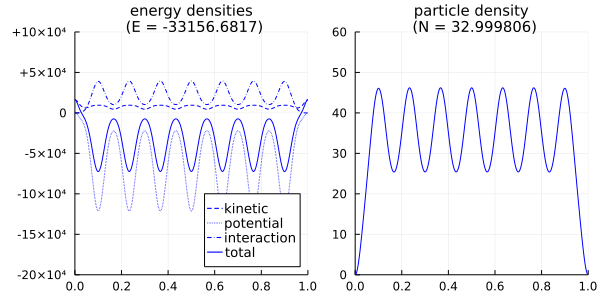

In [42]:
@load "FiniteCMPS_D=32_mu=1749_g=35_v=874sin.jld" Ψ
ρL, ρR, = environments!(Ψ)
total_energy_density = expval(density(Ĥ₂(μ = μ, v = v₂, g = g)), Ψ, ρL, ρR)
E = ∫(total_energy_density, (a, b))
kinetic_energy_density = expval(k̂, Ψ, ρL, ρR)
interaction_energy_density = expval(g * û, Ψ, ρL, ρR);# plot densities
particle_density = expval(n̂, Ψ, ρL, ρR)
N = ∫(particle_density, (a, b))
potential_energy_density = expval((v₂ - μ*one(v₂)) * n̂, Ψ, ρL, ρR)

p1 = plot(plotgrid, kinetic_energy_density.(plotgrid), xlims = (0,1), ylims = (-20e4, 10e4), linecolor = :blue, linestyle = :dash, yticks = ([-20e4, -15e4,-10e4,-5e4,0,5e4,10e4],["-20×10⁴","-15×10⁴","-10×10⁴","-5×10⁴","0","+5×10⁴","+10×10⁴"]), label="kinetic")
plot!(p1, plotgrid, potential_energy_density.(plotgrid), linecolor = :blue, linestyle = :dot, label="potential")
plot!(p1, plotgrid, interaction_energy_density.(plotgrid), linecolor = :blue, linestyle = :dashdot, label="interaction")
plot!(p1, plotgrid, total_energy_density.(plotgrid), linecolor = :blue, label="total")
plot!(p1, title = "energy densities\n (E = $(trunc(E; digits = 4)))")
p2 = plot(plotgrid, particle_density.(plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0,60), title="particle density\n (N = $(trunc(N; digits = 6)))")
display(plot(p1, p2, layout = (1,2), titlefontsize = 10, tickfontsize = 8, legendfontsize = 9,  legend = :bottomright, size = (600, 300)))
Ψ₂, ρL₂, ρR₂, E₂, e₂, n₂ = Ψ, ρL, ρR, E, total_energy_density, particle_density;

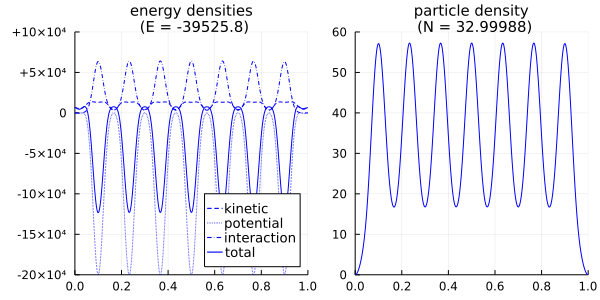

In [43]:
@load "FiniteCMPS_D=32_mu=1749_g=35_v=1749sin.jld" Ψ
ρL, ρR, = environments!(Ψ)
total_energy_density = expval(density(Ĥ₂(μ = μ, v = v₃, g = g)), Ψ, ρL, ρR)
E = ∫(total_energy_density, (a, b))
kinetic_energy_density = expval(k̂, Ψ, ρL, ρR)
interaction_energy_density = expval(g * û, Ψ, ρL, ρR);# plot densities
particle_density = expval(n̂, Ψ, ρL, ρR)
N = ∫(particle_density, (a, b))
potential_energy_density = expval((v₃ - μ*one(v₃)) * n̂, Ψ, ρL, ρR)

p1 = plot(plotgrid, kinetic_energy_density.(plotgrid), xlims = (0,1), ylims = (-20e4, 10e4), linecolor = :blue, linestyle = :dash, yticks = ([-20e4, -15e4,-10e4,-5e4,0,5e4,10e4],["-20×10⁴","-15×10⁴","-10×10⁴","-5×10⁴","0","+5×10⁴","+10×10⁴"]), label="kinetic")
plot!(p1, plotgrid, potential_energy_density.(plotgrid), linecolor = :blue, linestyle = :dot, label="potential")
plot!(p1, plotgrid, interaction_energy_density.(plotgrid), linecolor = :blue, linestyle = :dashdot, label="interaction")
plot!(p1, plotgrid, total_energy_density.(plotgrid), linecolor = :blue, label="total")
plot!(p1, title = "energy densities\n (E = $(trunc(E; digits = 4)))")
p2 = plot(plotgrid, particle_density.(plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0,60), title="particle density\n (N = $(trunc(N; digits = 6)))")
fig2 = plot(p1, p2, layout = (1,2), titlefontsize = 10, tickfontsize = 8, legendfontsize = 9,  legend = :bottomright, size = (600, 300))
display(fig2)
Ψ₃, ρL₃, ρR₃, E₃, e₃, n₃ = Ψ, ρL, ρR, E, total_energy_density, particle_density;

## Bethe ansatz and local density approximation

We now want to compare these density profiles to those predicted by applying the local density approximation to the Bethe ansatz results in the thermodynamic limit. Hereto, we have to solve the Bethe equations, which are given in terms of a parameter $q$ by an integral equation

$$\rho(k) = \frac{1}{2\pi} - \frac{1}{2\pi}\int_{-q}^{+q} K(g, k, k^\prime) \rho(k^\prime) d k^\prime$$

with the kernel $K$ given by

$$K(g, k, k^\prime) = \frac{-2g}{g^2 + (k-k^\prime)^2}$$

(see e.g. Eq. 2.42 in https://arxiv.org/pdf/1609.02100.pdf).

We can then compute the corresponding particle density

$$ n = \int_{-q}^{+q} \rho(k) d k$$

and energy density

$$ e = \int_{-q}^{+q} k^2 \rho(k) d k $$

and eliminate $q$ to find $e$ in terms of $n$. Note that the Bethe energy $e(q)$ only contains the contribution of the kinetic and interaction energy, and not that of the potential energy. In the ensemble of fixed particle number, we can compute the chemical potential as

$$ \mu = \frac{d e}{d n} = (\frac{d e}{d q}) / (\frac{d n}{d q}).$$

Alternatively, for a given $\mu$, we can directly find $q$ which minimizes $e(q) - \mu n(q)$ which results in the same equation.

To compute the derivatives $\frac{d n}{d q}$ and $\frac{d e}{d q}$, we compute $\frac{ d \rho}{d q}(k)$, which is similarly defined by the integral equation

$$\frac{ d \rho}{d q}(k) = K(g, k, q)  \frac{\rho(q)}{2\pi} + K(g, k, -q) \frac{\rho(-q)}{2\pi} +  \frac{1}{2\pi}\int_{-q}^{+q} K(g, k, k^\prime) \frac{ d \rho}{d q}(k^\prime) d k^\prime.$$

We solve these integral equations by discretising the $k$-interval $(-q, q)$ in $N$ segments, using the most naive form of numerical integration (midpoint rule). 

In [44]:
kernel(g, k, k′) = -2*g/(g^2+(k-k′)^2)
function bethe(g, q; N = 100)
    if iszero(q)
        return 0., 0., 1/pi, 0.
    end
    dk = 2*q/N
    kgrid = range(-q, stop = q, length = N+1)
    dkgrid = dk*vcat([0.5], ones(Float64, N-1), [0.5])
    M = I + (kernel.(g, kgrid, kgrid') .* dkgrid')/(2π)
    ρ = M\(ones(Float64, N+1)/(2π))
    dρ = M\((-1/(2π)) .* (kernel.(g, kgrid, q) .* ρ[N] .+ kernel.(g, kgrid, -q) .* ρ[1]))
    e = sum(kgrid.^2 .* ρ .* dkgrid)
    de = q^2*ρ[end] + q^2*ρ[1] + sum(kgrid.^2 .* dρ .* dkgrid)
    n = sum(ρ .* dkgrid)
    dn = ρ[end] + ρ[1] + sum(dρ .* dkgrid)
    return n, e, dn, de
end

bethe (generic function with 1 method)

We now compute the result of the `bethe` function for a range of `q` values, sufficiently big such that the resulting chemical potentials range from $0$ to $2\mu$ with $\mu = 1749$, which is what we will need to be able to apply the local density approximation to our local values of the chemical potential $\mu - V(x)$.

In [45]:
qgrid = range(0, stop = 75, length = 1000)
n_bethe = zeros(Float64, length(qgrid))
e_bethe = zeros(Float64, length(qgrid))
dn_bethe = zeros(Float64, length(qgrid))
de_bethe = zeros(Float64, length(qgrid))
for (i, q) in enumerate(qgrid)
    n_bethe[i], e_bethe[i], dn_bethe[i], de_bethe[i] = bethe(g, q)
end
μ_bethe = de_bethe ./ dn_bethe;
@show maximum(μ_bethe) > 2*μ;

maximum(μ_bethe) > 2μ = true


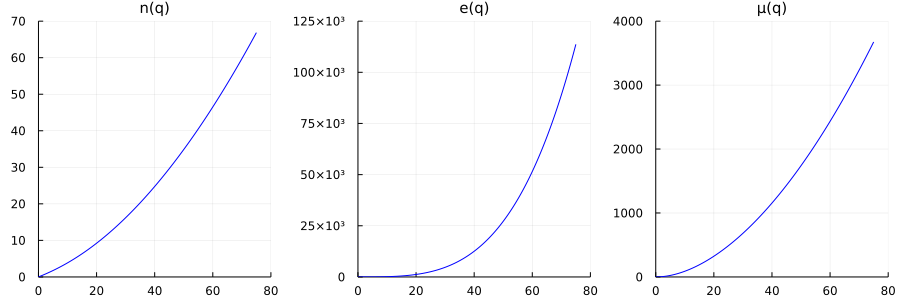

In [46]:
p1 = plot(qgrid, n_bethe, linecolor = :blue, title = "n(q)", xlim = (0,80), ylim = (0, 70), labels = "")
p2 = plot(qgrid, e_bethe, linecolor = :blue, title = "e(q)", xlim = (0,80), ylim = (0,12.5e4), yticks = ([0,25,50,75,100,125]*1e3, ["0","25×10³","50×10³","75×10³","100×10³","125×10³"]), labels = "")
p3 = plot(qgrid, μ_bethe, linecolor = :blue, title = "μ(q)", xlim = (0,80), ylim = (0,4000), labels = "")
plot(p1, p2, p3, layout = (1,3), size = (900, 300), titlefontsize = 10, tickfontsize = 8)

As in particular $\mu$ is a monotonically increasing array, we can easily eliminate $q$ and obtain the particle and energy density as a function of the chemical potential by using linear interpolation. We define

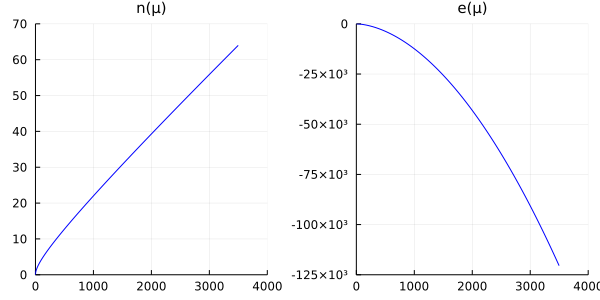

In [47]:
particle_density_bethe = PiecewiseLinear(μ_bethe, n_bethe)
energy_density_bethe = PiecewiseLinear(μ_bethe, e_bethe .- μ_bethe .* n_bethe)
μ_range = range(0, stop = 2*μ, length = 1000)
p1 = plot(μ_range, particle_density_bethe.(μ_range), linecolor = :blue, title = "n(μ)", xlim = (0, 4000), ylim = (0, 70), labels = "")
p2 = plot(μ_range, energy_density_bethe.(μ_range), linecolor = :blue, title = "e(μ)", xlim = (0, 4000), ylim = (-125e3,0), yticks = ([0,-25,-50,-75,-100,-125]*1e3, ["0","-25×10³","-50×10³","-75×10³","-100×10³","-125×10³"]), labels = "")
plot(p1, p2, titlefontsize = 10, tickfontsize = 8, layout = (1, 2), size = (600, 300))

We can compare the Bethe ansatz result with our infinite cMPS result:

In [48]:
@show particle_density_bethe(μ), n∞[]
@show energy_density_bethe(μ), e∞[];

(particle_density_bethe(μ), n∞[]) = (35.026801145970985, 34.99117387895839)
(energy_density_bethe(μ), e∞[]) = (-33805.509303889965, -33805.04330905992)


The infinite cMPS result is (sometimes, depending on the random initial guess) a bit lower in energy, which seems to be in violation of the variational principle. This is caused, not by an error in the linear interpolation (as $e(\mu)$ is concave), but because of the approximation of the integral in the Bethe equations. Indeed, we can find the optimal $q$ for given $\mu$ by minimizing $e(q) - \mu n(q)$ as outlined above, and now use a higher value of $N$, the number of points in the midpoint approximation to the integral. Practically, we find $q$ by finding the zero of $\frac{d e}{d q} - \mu \frac{d n}{d q}$ using a simple secant method.

In [49]:
q_guess = PiecewiseLinear(μ_bethe, collect(qgrid))(μ)
q_a = q_guess - 0.1
n_a, e_a, dn_a, de_a = bethe(g, q_a; N = 2000)
q_b = q_guess + 0.1
n_b, e_b, dn_b, de_b = bethe(g, q_b; N = 2000)
@show grad_a = de_a - μ * dn_a
@show grad_b = de_b - μ * dn_b
i = 1
q_c = (q_a * grad_b - q_b * grad_a) / (grad_b - grad_a)
n_c, e_c, dn_c, de_c = bethe(g, q_c; N = 2000)
grad_c = de_c - μ * dn_c
println("Secant iteration $i: de_c - μ * dn_c = $grad_c")

grad_a = de_a - μ * dn_a = -5.010515887884594
grad_b = de_b - μ * dn_b = 9.00659919917507
Secant iteration 1: de_c - μ * dn_c = -0.014559833710563908


In [50]:
while abs(grad_c) > 1e-12
    i += 1
    if grad_c < 0
        q_a = q_c
        grad_a = grad_c
    else
        q_b = q_c
        grad_b = grad_c
    end
    q_c = (q_a * grad_b - q_b * grad_a) / (grad_b - grad_a)
    n_c, e_c, dn_c, de_c = bethe(g, q_c; N= 2000)
    grad_c = de_c - μ * dn_c
    println("Secant iteration $i: de_c - μ * dn_c = $grad_c")
end

Secant iteration 2: de_c - μ * dn_c = -4.2186816017419915e-5
Secant iteration 3: de_c - μ * dn_c = -1.222347236762289e-7
Secant iteration 4: de_c - μ * dn_c = -3.5424818634055555e-10
Secant iteration 5: de_c - μ * dn_c = -6.821210263296962e-13


In [51]:
@show e_c - μ*n_c, e∞[];
@show n_c, n∞[];

(e_c - μ * n_c, e∞[]) = (-33811.374379066714, -33805.04330905992)
(n_c, n∞[]) = (34.99770748796796, 34.99117387895839)


Problem solved: in fact, the infinite cMPS result was still a bit too high, which can be a result of finite bond dimension $D$, but also because it was not fully converged at the current bond dimension either.

We now compare the inhomogeneous results obtained with the finite cMPS to a local density approximation applied to the Bethe ansatz, i.e. we assume that the local energy density $e(x)$ and $n(x)$ is just that of the thermodynamic limit Bethe ansatz result corresponding to a chemical potential $\mu(x) = \mu - V(x)$.

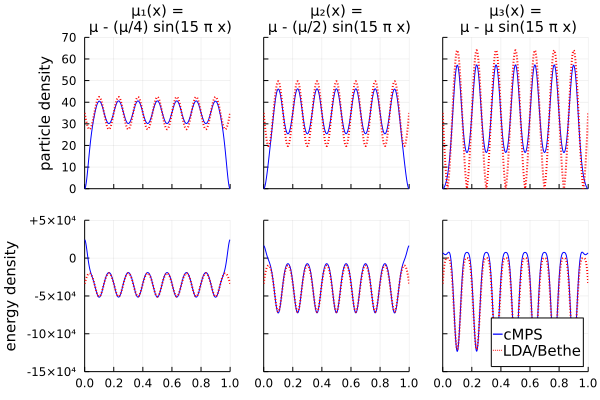

In [52]:
μ₁(x) = μ - v₁(x)
μ₂(x) = μ - v₂(x)
μ₃(x) = max(μ - v₃(x), 0.) # can become slightly negative due to floating point errors
p1 = plot(plotgrid, n₁.(plotgrid), linecolor = :blue, label = "", xlims = (0,1), ylims = (0,70), xticks = (0:0.2:1, [""]), yticks = 0:10:70, yguide="particle density", title = "μ₁(x) =\n μ - (μ/4) sin(15 π x)", titlefontsize = 10)
plot!(p1, plotgrid, particle_density_bethe.(μ₁.(plotgrid)), label = "", linecolor = :red, linewidth = 2, linestyle = :dot)
p2 = plot(plotgrid, n₂.(plotgrid), linecolor = :blue, labels = "", xlims = (0,1), ylims = (0,70), xticks = (0:0.2:1, [""]), yticks = (0:10:70, [""]), title = "μ₂(x) =\n μ - (μ/2) sin(15 π x)", titlefontsize = 10)
plot!(p2, plotgrid, particle_density_bethe.(μ₂.(plotgrid)), label = "", linecolor = :red, linewidth = 2, linestyle = :dot)
p3 = plot(plotgrid, n₃.(plotgrid), linecolor = :blue, labels = "", xlims = (0,1), ylims = (0,70), xticks = (0:0.2:1, [""]), yticks = (0:10:70, [""]), title = "μ₃(x) =\n μ - μ sin(15 π x)", titlefontsize = 10)
plot!(p3, plotgrid, particle_density_bethe.(μ₃.(plotgrid)), label = "", linecolor = :red, linewidth = 2, linestyle = :dot)
p4 = plot(plotgrid, e₁.(plotgrid), linecolor = :blue, labels = "", xlims = (0,1), ylims = (-15e4,+5e4), xticks = 0:0.2:1, yticks = ((-15:5:5)*1e4, ["-15×10⁴","-10×10⁴","-5×10⁴","0","+5×10⁴"]), yguide="energy density")
plot!(p4, plotgrid, energy_density_bethe.(μ₁.(plotgrid)), label = "", linecolor = :red, linewidth = 2, linestyle = :dot)
p5 = plot(plotgrid, e₂.(plotgrid), linecolor = :blue, labels = "", xlims = (0,1), ylims = (-15e4,+5e4), xticks = 0:0.2:1, yticks = ((-15:5:5)*1e4, [""]))
plot!(p5, plotgrid, energy_density_bethe.(μ₂.(plotgrid)), label = "", linecolor = :red, linewidth = 2, linestyle = :dot)
p6 = plot(plotgrid, e₃.(plotgrid), linecolor = :blue, label = "cMPS", xlims = (0,1), ylims = (-15e4,+5e4), xticks = 0:0.2:1, yticks = ((-15:5:5)*1e4, [""]))
plot!(p6, plotgrid, energy_density_bethe.(μ₃.(plotgrid)), label = "LDA/Bethe", linecolor = :red, linewidth = 2, linestyle = :dot)
fig3 = plot(p1, p2, p3, p4, p5, p6, layout = (2, 3), titlefontsize = 10, labelfontsize = 10, tickfontsize = 8, legendfontsize = 10, legend = :bottomright, size = (600, 400))

We see that the local density approximation (LDA) is quite good away from the boundaries for the energy density in the case of $V_1(x)$ and $V_2(x)$ which are sufficiently smaller than the chemical potential (though the particle density prediction has already significant errors). In the case $V_3(x)$, both energy and particle density cannot be captured by the LDA.

## Casimir energy

As a final example, we calculate the boundary or Casimir energy of such an interacting Bose gas. We therefore study the system in a box of length $L = 1$ with $V(x) = 0$, $μ = 10000$ and $g = 1000$ using a cMPS with $D = 64$ and a grid of 300 intervals (with an inhomogeneous distribution of the grid points such that there are more points in the bulk of the system). We first find the corresponding infinite cMPS describing this system in the thermodynamic limit. Again we can load a preconverged result from disk.

In [53]:
g = 1000.
μ = 10000.
D = 64 # bond dimension
T = Float64 # scalar type
optimisation = false
if optimisation
    Q₀ = randn(T, (D,D))
    R₀ = randn(T, (D,D))
    Ψ∞ = InfiniteCMPS(Constant(Q₀), Constant(R₀))
    alg = LBFGS(80; verbosity = 2, maxiter = 2000)
    Ψ∞, ρL∞, ρR∞, E∞, e∞, normgrad, numfg, history = groundstate(Ĥ∞(g = g, μ = μ), Ψ∞; optalg = alg)
else
    @load "InfiniteCMPS_D=64_mu=10000_g=1000.jld" Ψ∞
    ρL∞, ρR∞ = environments!(Ψ∞)
    e∞ = expval(density(Ĥ∞(g = g, μ = μ)), Ψ∞, ρL∞, ρR∞)
    E∞ = e∞[]
end
n∞ = expval(n̂, Ψ∞, ρL∞, ρR∞)
@show e∞[], n∞[];

(e∞[], n∞[]) = (-226719.8785356393, 34.78371499589153)


Let's compare this to the Bethe ansatz result. We again run our secant algorithm, now for $g = 1000$ and using a very wide initial interval.

In [54]:
q_a = 0
n_a, e_a, dn_a, de_a = bethe(g, q_a; N = 2000)
q_b = 200
n_b, e_b, dn_b, de_b = bethe(g, q_b; N = 2000)
@show grad_a = de_a - μ * dn_a
@show grad_b = de_b - μ * dn_b
i = 1
q_c = (q_a * grad_b - q_b * grad_a) / (grad_b - grad_a)
n_c, e_c, dn_c, de_c = bethe(g, q_c; N = 2000)
grad_c = de_c - μ * dn_c
println("Secant iteration $i: de_c - μ * dn_c = $grad_c")
while abs(grad_c) > 1e-9
    i += 1
    if grad_c < 0
        q_a = q_c
        grad_a = grad_c
    else
        q_b = q_c
        grad_b = grad_c
    end
    q_c = (q_a * grad_b - q_b * grad_a) / (grad_b - grad_a)
    n_c, e_c, dn_c, de_c = bethe(g, q_c; N= 2000)
    grad_c = de_c - μ * dn_c
    println("Secant iteration $i: de_c - μ * dn_c = $grad_c")
end
n_bethe = n_c;
e_bethe = e_c;

grad_a = de_a - μ * dn_a = -3183.098861837907
grad_b = de_b - μ * dn_b = 11031.01252642418
Secant iteration 1: de_c - μ * dn_c = -2708.554097809087
Secant iteration 2: de_c - μ * dn_c = -1578.4594426260833
Secant iteration 3: de_c - μ * dn_c = -730.1310912609774
Secant iteration 4: de_c - μ * dn_c = -302.31314085421036
Secant iteration 5: de_c - μ * dn_c = -119.45735260237507
Secant iteration 6: de_c - μ * dn_c = -46.33198001324445
Secant iteration 7: de_c - μ * dn_c = -17.840272341965374
Secant iteration 8: de_c - μ * dn_c = -6.850284763793297
Secant iteration 9: de_c - μ * dn_c = -2.627541528275742
Secant iteration 10: de_c - μ * dn_c = -1.007422638108892
Secant iteration 11: de_c - μ * dn_c = -0.3861937547890193
Secant iteration 12: de_c - μ * dn_c = -0.14803775749805936
Secant iteration 13: de_c - μ * dn_c = -0.05674527061455592
Secant iteration 14: de_c - μ * dn_c = -0.021751188015059597
Secant iteration 15: de_c - μ * dn_c = -0.008337480142472486
Secant iteration 16: de_c - μ * d

In [55]:
@show e_bethe - μ*n_bethe, e∞[];
@show n_bethe, n∞[];
@show γ = g/n_bethe;

(e_bethe - μ * n_bethe, e∞[]) = (-226721.31724399352, -226719.8785356393)
(n_bethe, n∞[]) = (34.7839391764108, 34.78371499589153)
γ = g / n_bethe = 28.748900316562295


Note that a generic cMPS, in particular an infinite cMPS, is similar to a coherent state in that it discribes a superposition over different particle numbers. It does thus not have a fixed paricle number, i.e. it breaks the $\mathsf{U}_1$ particle number symmetry, and has a nonzero expectation value for the order parameter $\langle \hat{\psi}\rangle$ corresponding to Bose-Einstein condensation. This is different for the exact solution, which has no total particle number flucutations even in the thermodynamic limit, and thus a zero value for the order parameter, i.e. there is no Bose-Einstein condensation in one spatiatl dimension. We can measure the order parameter for the optimal cMPS and find that it is quite large (though it should be measured relative to the square root of the density to have an intrinsic value); breaking the global $\mathsf{U}_1$ symmetry helps significantly to reduce the entanglement but has little effect on the local properties of the state:

In [56]:
@show bec_order∞ = expval(ψ̂, Ψ∞, ρL∞, ρR∞)[];
@show relative_bec_order∞ = bec_order∞ / sqrt(n∞[]);

bec_order∞ = (expval(ψ̂, Ψ∞, ρL∞, ρR∞))[] = 1.5282840611601531
relative_bec_order∞ = bec_order∞ / sqrt(n∞[]) = 0.25912904935488223


Now we compute the corresponding finite cMPS approximation for the Bose gas in the box. We can again use the infinite result to construct a slightly better initial guess. Nonetheless, we recommend using the converged result from disk, as this optimisation requires a large number of iterations and can thus take several days or weeks.

In [57]:
optimisation = false
if optimisation
    Q∞, (R∞,) = Ψ∞
    Q₀ = Q∞[]
    R₀ = R∞[]
    Σ, U = eigen(Hermitian(ρR∞[]); sortby=x->(-abs(x)))
    Λ = Diagonal(sqrt.(Σ))
    Q₀ = sqrt(Λ)\U'*Q₀*U*sqrt(Λ)
    R₀ = sqrt(Λ)\U'*R₀*U*sqrt(Λ)
    N = 300
    krange = range(0.,stop = 1.,length = N+1);
    grid = (1 .- cos.(krange .* pi)) ./ 2
    Q = PiecewiseLinear(grid, [Q₀ for x in grid])
    δ = 1/30
    R = PiecewiseLinear(grid, [R₀*ifelse(x<δ, x/δ, ifelse(1-x < δ, (1-x)/δ, 1.)) for x in grid])
    vL = setindex!(zeros(T, D), 1, 1)
    vR = setindex!(zeros(T, D), 1, 1)
    Ψ₀ = FiniteCMPS(Q, R, vL, vR);    
    alg = LBFGS(50; maxiter = 10^6)    
    Ψ, ρL, ρR, E, e, normgrad, numfg, history =
        groundstate(Ĥ₁(μ=μ, g=g), Ψ₀; optalg = alg, callback = plotresults₁(μ=μ, g=g; frequency = 1));
else
    @load "FiniteCMPS_D=64_mu=10000_g=1000.jld" Ψ
    ρL, ρR = environments!(Ψ)
    E = expval(Ĥ₁(μ=μ, g=g), Ψ, ρL, ρR)
end;

As before, we plot the particle density and different contributions to the energy density.

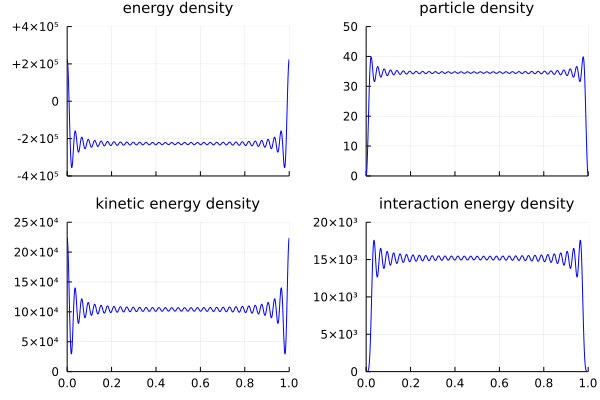

In [58]:
energy_density = expval(CMPSKit.density(Ĥ₁(μ=μ, g=g)), Ψ, ρL, ρR)
particle_density = expval(n̂, Ψ, ρL, ρR)
kinetic_energy_density = expval(k̂, Ψ, ρL, ρR)
interaction_energy_density = expval(g*û, Ψ, ρL, ρR)
plotgrid = 0:1/3200:1
p1 = plot(plotgrid, energy_density.(plotgrid), linecolor = :blue, xlim = (0,1), ylim = (-4e5, 4e5), xticks = (0:0.2:1,[""]), yticks = ((-4:2:4) .* 1e5, ["-4×10⁵", "-2×10⁵", "0","+2×10⁵","+4×10⁵"]), label = "", title = "energy density")
p2 = plot(plotgrid, particle_density.(plotgrid), linecolor = :blue, xlim = (0,1), ylim = (0, 50), label = "", title="particle density", xticks = (0:0.2:1,[""]))
p3 = plot(plotgrid, kinetic_energy_density.(plotgrid), linecolor = :blue, xlim = (0,1), ylim = (0, 25e4), yticks = ((0:5:25) .* 1e4, ["0", "5×10⁴", "10×10⁴","15×10⁴","20×10⁴","25×10⁴"]), label = "", title = "kinetic energy density")
p4 = plot(plotgrid, interaction_energy_density.(plotgrid), linecolor = :blue, xlim = (0,1), ylim = (0, 2e4), yticks = ((0:5:20) .* 1e3, ["0", "5×10³", "10×10³","15×10³","20×10³"]), label="", title="interaction energy density")
fig4 = plot(p1, p2, p3, p4, layout = (2,2), titlefontsize = 10, tickfontsize = 8, size = (600, 400))

We observe strong Friedel oscillations resulting from the hard boundaries, which exist throughout the whole system. Note that the same pattern also manifests itself in the entanglement structure of the ground state, by considering a left-right bipartition of the system for various positions $0\leq x \leq 1$ of the cut.

In [59]:
entanglement_grid = 0:1/3200:1
spectra = sort.(real.(eigvals.((ρL*ρR).(entanglement_grid))), rev=true)
spectra_reorganized = [collect(abs(s[i]) for s in spectra) for i = 1:D]
entropy(spectrum) = sum(-abs(p)*log(abs(p)) for p in spectrum)
p1 = plot(entanglement_grid, spectra_reorganized, linewidth = 0.3, linecolor = :blue, xlim = (0,1), yscale = :log10, label="", ylim = (1e-12,1), title = "entanglement spectra")
p2 = plot(entanglement_grid, entropy.(spectra),  linecolor = :blue, xlim = (0,1), ylim = (0, 1.25), label="", title = "entanglement entropy")
fig5 = plot(p1, p2, layout = (1,2), titlefontsize = 10, tickfontsize = 8, size = (600, 200))

The location of the peaks, in particular in the particle density, can be interpreted as the location of the particles, which have strong tendency to be fixed on a lattice. In the thermodynamic limit, such a lattice cannot exist in one dimension without explicit breaking of translation symmetry by an external potential, but in a finite box the boundaries provide the required symmetry breaking. At the same time, compared to the infinite cMPS, the finite cMPS does preserve the $\mathsf{U}_1$ particle number symmetry very well. We can assess this by both computing the total particle number variance, as well as by again considering the order parameter for Bose-Einstein condensation and taking its maximal value in the interval $[a,b]$. 

In [60]:
@show N = expval(N̂, Ψ, ρL, ρR);
R, = Ψ.Rs
@show ΔN² = 2*integrate(localdot(leftenv(N̂, (Ψ,ρL,ρR))[1], R*ρR*R')) + N - N^2;
@show ΔN_relative = sqrt(ΔN²)/N
@show bec_order = maximum(abs.(expval(ψ̂, Ψ, ρL, ρR).(plotgrid)))
average_density = N/(b-a)
@show relative_bec_order = bec_order / sqrt(average_density);

N = expval(N̂, Ψ, ρL, ρR) = 33.99992574286642
ΔN² = (2 * integrate(localdot((leftenv(N̂, (Ψ, ρL, ρR)))[1], R * ρR * R')) + N) - N ^ 2 = 0.0006753739962732652
ΔN_relative = sqrt(ΔN²) / N = 0.0007643533952103132
bec_order = maximum(abs.((expval(ψ̂, Ψ, ρL, ρR)).(plotgrid))) = 0.001741720381141682
relative_bec_order = bec_order / sqrt(average_density) = 0.00029870290726840204


Hence, this finite cMPS thus describes an almost exact eigenstate of the particle number operator with an eigenvalue of 34 particles, and very few fluctuations on top of that. The value of the order parameter for condensation is three orders of magnitude smaller than the one if the infinite cMPS.


Finally, we compute the "Casimir energy". With cMPS, this is easily given by

In [61]:
Eb = E - e∞[] * (b-a)

5663.793738987035

An exact result for the Casimir boundary energy from Bethe ansatz is only available for the case where the bulk (i.e. the size of the box) goes to infinity, and was only computed recently:
B. Reichert, G. E. Astrakharchik, A. Petković, and Z. Ristivojevic, Physical Review Letters 123, 250602 (2019).
https://doi.org/10.1103/PhysRevLett.123.250602

Given that we have two boundaries, we add an extra factor of two to the computation of the boundary energy $E_b$.

In [62]:
function bethe_with_boundary(g, q; N = 100)
    if iszero(q)
        return 0., 0., 1/pi, 0.
    end
    dk = 2*q/N
    kgrid = range(-q, stop = q, length = N+1)
    dkgrid = dk*vcat([0.5], ones(Float64, N-1), [0.5])
    M = I + (kernel.(g, kgrid, kgrid') .* dkgrid')/(2π)
    ρ = M\(ones(Float64, N+1)/(2π))
    dρ = M\((-1/(2π)) .* (kernel.(g, kgrid, q) .* ρ[N] .+ kernel.(g, kgrid, -q) .* ρ[1]))
    e = sum(kgrid.^2 .* ρ .* dkgrid)
    de = q^2*ρ[end] + q^2*ρ[1] + sum(kgrid.^2 .* dρ .* dkgrid)
    n = sum(ρ .* dkgrid)
    dn = ρ[end] + ρ[1] + sum(dρ .* dkgrid)
    g = M\(sign.(kgrid) ./ 4 .+ atan.(2 .* kgrid ./ g) ./ (2π))
    Eb = 2*sum(kgrid .* g .* dkgrid)
    return n, e, Eb, dn, de
end

bethe_with_boundary (generic function with 1 method)

In [63]:
n_bethe, e_bethe, Eb_bethe, = bethe_with_boundary(g, q_c; N = 2000);
@show Eb_bethe;

Eb_bethe = 5675.969153580592


These values match quite well, given that the Bethe ansatz result should only be valid in the thermodynamic limit.

In [64]:
# Export figures
# using Plots: savefig
# savefig(fig1a, "fig1a.pdf")
# savefig(fig1b, "fig1b.pdf")
# savefig(fig2, "fig2.pdf")
# savefig(fig3, "fig3.pdf")
# savefig(fig4, "fig4.pdf")
# savefig(fig5, "fig5.pdf")
# savefig(appendix_fig1, "appendix_fig1.pdf")